# Overview

## Motivation
Imagine you live in Toronto and have been offered a job opportunity in New York city. You really enjoy your neighborhood in Toronto and would like to move to a similar neighborhood in New York city. However, you don’t know New York. Or you may know that you want to narrow your search to Manhattan, but where in Manhattan would you choose? 

In my project as a Data Incubator fellow, I would like to address this question. Let’s say given two cities, can we use data to find neighborhoods that are similar in both cities?

##  Data Sources
I will be using the following data sources:

**Wikipedia**: First, I scrape Wikipedia’s page for Toronto’s neighborhoods using python’s beautiful soup and requests packages to get the list of postcodes, boroughs and neighborhoods of Toronto. https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M

**NYU Spatial Data Repository**: Next, I download the json file of New York’s neighborhoods from NYU’s spatial data repository website. https://cocl.us/new_york_dataset

**Google maps platform**: Then, I use Google’s Geocoding API and python’s geopy package to get the latitude and longitude of Toronto’s and New York’s neighborhoods.
https://developers.google.com/maps/documentation/geocoding/start

**Foursquare Places API**: Next, I utilize the Foursquare Places API for gathering the businesses/venues information in the two cities. For each venue, I get the following:
Name, category, latitude, longitude.
https://developer.foursquare.com/places-api

**NYC Open Data**: Finally, I download New York House Sales Data (2003-2015) from NYC Open Data website.
https://data.cityofnewyork.us/Housing-Development/NYC-Calendar-Sales-Archive-/uzf5-f8n2


## Analysis:

After acquiring the data as mentioned above, I clean the data and transform it into the appropriate formats.

Basically, for each neighborhood in Toronto and Manhattan, I search for fifty venues in that neighborhood. (Fifty is the limit for this query on Foursquare API.)

Next, I profile each neighborhood by creating one hot encoding of venue categories and group the record by neighborhoods and take the mean. Now I have the mean frequency of occurrence of each venue category. 

I can further explore this to get a sense of distribution of categories in each neighborhood. So, I create a function to give me the top ten venue categories in each neighborhood. Now, I can get some sense of what each neighborhood is about. 


Next, I’m going to use the one hot encoding to cluster the neighborhoods. I choose k-means clustering using python’s scikit-learn library. I try the elbow method to find the appropriate number of clusters. There wasn’t very sharp cut elbow but I at k equal to eight is best one. I choose a k equal 8 clusters, and cluster the neighborhoods.

With the help of python’s folium library, I create interactive leaflet maps and visualize the clusters on the map for each city. Each circle on the map contains the neighborhood, cluster label and the borough. 

Now, I can see which Manhattan neighborhoods are in the same cluster as my original Toronto neighborhood. These should be the most similar neighborhoods based on the venue data we have.

Finally, I utilize Manhattan house sales price. I group the sales by neighborhood, year and month, take their averages and create a new data frame.

Now, I use the monthly average neighborhood house sale price in two ways. First, I use the latest monthly as a filtering criterion; I can determine that I’m interested only in neighborhoods with the average price in a certain range. This may eliminate some of the similar neighborhoods or at least give the edge to some.
 
I also utilize python’s Keras library to train an LSTM model to predict future average sales price for that neighborhood. This could be used as the other criterion for choosing the best neighborhood fit as it presents good investing opportunity or prevents a risky one for the person who’s moving to Manhattan

## Conclusion
In summary, I was able to find the similar neighborhoods in both cities through clustering. Though this can be improved upon greatly in terms of algorithm or the similarity measure. 
My experiment with LSTM wasn’t very successful and more time and manipulation of the structure and parameters of the LSTM is necessary to be able to get a good model.


 


If I’m lucky to become a data incubator fellow, during the eight weeks fellowships, time allowing, I would like to improve this project. The followings are some of my ideas:

1.	I would like to present the project as a web app on Heroku’s platform where the user can pick their cities and other criteria of their choice and the app gives them the recommendations and the analysis results. 
2.	I can expand the project to include more cities. For example, I can choose three different countries and two major cities from each country. This way, I can also compare the results of the cities from each country and see if there is any pattern within each country compared to other countries.
3.	I would like to use more data sources in my analysis. 
4.	I can improve the clustering task by using more sophisticated methods of finding the optimum number of clusters compared to the elbow method.

# Imports

In [979]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import geocoder 
from geopy.geocoders import Nominatim
from geopy.geocoders import GoogleV3
import folium # map rendering library
import sys
import numpy as np
from sklearn.cluster import KMeans 
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns 
from sklearn.decomposition import PCA
import glob
from pandas import ExcelWriter
from pandas import ExcelFile
from sklearn import metrics
# from sklearn.preprocessing import MinMaxScaler
# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import LSTM
# from keras.layers import Dropout

# Toronto's Data: Acquiring, Cleaning & Pre-Processing

First, I'm going to scrape the wikipedia page below to obtain Toronto's neighborhoods and tranform the data into a pandas data frame.  
https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M

In [2]:
# using requests and bs4 to scrape Wikipedia table:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M' #url of Toronto's neighborhoods information
r = requests.get(url)

soup = BeautifulSoup(r.text,'html.parser')
# type(soup)

In [3]:
# print(soup.prettify())

In [112]:
data = []

table = soup.find('table', class_='sortable')

ths = table.find_all('th')
headings = [th.text.strip() for th in ths]

table_body = table.find('tbody')

rows = table_body.find_all('tr')

for row in rows:
    cols = row.find_all('td')
    cols = [ele.text.strip() for ele in cols]       
    data.append([ele for ele in cols if ele])

In [113]:
tor_data = pd.DataFrame(data=data, columns=headings)

tor_data.to_csv('../data/toronto.csv')
print(tor_data.shape)
tor_data.head()

(289, 3)


,Postcode,Borough,Neighbourhood
0,None,None,None
1,M1A,Not assigned,Not assigned
2,M2A,Not assigned,Not assigned
3,M3A,North York,Parkwoods
4,M4A,North York,Victoria Village


In [114]:
tor_data = tor_data.drop(['Postcode'], axis=1)
tor_data = tor_data.dropna()
tor_data =tor_data[tor_data['Borough'] != 'Not assigned']
#keep only boroughs with "Toronto" in their name
tor_data = tor_data[tor_data.Borough.str.contains('Toronto', regex=True)].reset_index(drop=True)
tor_data= tor_data.rename(columns = {'Neighbourhood':'Neighborhood'})

tor_data.shape

(74, 2)

**Getting the lattitude and longitude of neighborhoods**  
I use python's Geocoder package to retirve the lattitude and longitude of the neighborhoods of Toronto.

In [115]:
latitude=[]
longitude=[]

# initialize your variable to None
lat_lng_coords = None

for Neighborhood in tor_data['Neighborhood']:
#     # loop until you get the coordinates
#     while(lat_lng_coords is None):
    try:
        g = geocoder.google('{}, Toronto, Ontario'.format(Neighborhood))
        lat_lng_coords = g.latlng
    
        latitude.append(lat_lng_coords[0])
        longitude.append(lat_lng_coords[1])
    except:
        latitude.append(None)
        longitude.append(None)

latitude[0:5]

[None, None, None, None, None]

The geocoder pakage didn't work. We keep gettin None values. I try the geopy package instead now.

In [116]:
geolocator = Nominatim(user_agent="HS")

latitude=[]
longitude=[]

for Neighborhood in tor_data['Neighborhood']:
#     print(Neighborhood)
    try:
        location = geolocator.geocode('{}, Toronto, Ontario'.format(Neighborhood))
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    except:
        latitude.append('Not Found')
        longitude.append('Not Found')

longitude[0:10]

[-79.3801495,
 -79.3604569,
 -79.37908010263,
 -79.3771275,
 -79.3727041,
 -79.296712,
 -79.3753927260178,
 -79.3842242,
 -79.4184051,
 -79.3794979135182]

This didn't work either. So I'm going to sign up for google geocoding API and create a key and use it along geopy.  

GeoPy’s documentation
- https://geopy.readthedocs.io/en/stable/#googlev3

Get Started with Google Maps Platform
- https://developers.google.com/maps/gmp-get-started#setup-procedures

Developer Guide: What is Geocoding?
- https://developers.google.com/maps/documentation/geocoding/intro  

I will place google API key in a text file and read it from there so it won't get exposed.

In [105]:
def getNeighborhoodLatLong(city_data, address, city_name):
    
    f = open('../API info/google_api_key.txt')
    google_api_key = f.read()
    
    geolocator = GoogleV3(api_key = google_api_key)

    latitude=[]
    longitude=[]

    for Neighborhood in city_data['Neighborhood']:
        try:
            location = geolocator.geocode('{}, {}'.format(Neighborhood, address))
            latitude.append(location.latitude)
            longitude.append(location.longitude)
        except:
            latitude.append('Not Found')
            longitude.append('Not Found')

    city_data['Latitude'] = latitude
    city_data['Longitude'] = longitude

    city_data = city_data[city_data['Latitude'] != 'Not Found']

    city_data.to_csv('../data/{}_processed.csv'.format(city_name))

    print(city_data.shape)
    return city_data.head()

In [118]:
getNeighborhoodLatLong(city_data=tor_data, address= 'Toronto, Ontario', city_name= 'toronto')

(74, 4)


/usr/local/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


,Borough,Neighborhood,Latitude,Longitude
0,Downtown Toronto,Harbourfront,43.640552,-79.378937
1,Downtown Toronto,Regent Park,43.660323,-79.362044
2,Downtown Toronto,Ryerson,43.657658,-79.378802
3,Downtown Toronto,Garden District,43.656898,-79.376122
4,Downtown Toronto,St. James Town,43.670867,-79.373306


## Creating a map of Toronto with neighborhoods superimposed on top
Lets first define a function to get the latitude and longitude of Toronto. I use nominatim for this.

In [471]:
def getCoordinate(address):
    
    geolocator = Nominatim(user_agent="HS")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
#     print('The geograpical coordinate of {} are {}, {}.'.format(address, latitude, longitude))
    return latitude,longitude

In [82]:
getCoordinate('Toronto, Ontario')

(43.653963, -79.387207)

In [169]:
# create map of the city using latitude and longitude values

def makeMap(address, city_data, zoom_level):
    
    latitude,longitude = getCoordinate(address)

    m = folium.Map(location=[latitude, longitude], zoom_start=zoom_level)

    # add markers to map
    for lat, lng, borough, neighborhood in zip(city_data['Latitude'], city_data['Longitude'],
                                               city_data['Borough'], city_data['Neighborhood']):

        label = '{}- {}'.format(neighborhood, borough)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(m)
    
    return m

In [170]:
makeMap(address='Toronto, Ontario' , city_data= tor_data, zoom_level=12)

## Foursquare Places API  

Now I am going to start utilizing the Foursquare API to explore the neighborhoods and segment them.  

First, I create an account on Foursqure developer website: https://developer.foursquare.com/ 
  
There are two types of free account with different rate limits that I can use:
- Sandbox account: 950 Regular API Calls per day and 50 Premium API Calls per day.
- Personal acocunt: 99,500 Regular API Calls per day and 500 Premium API Calls per day.

To upgrade to personal account, I just need to provide my credit card information for verification purposes.

Foursqaure API documentation (https://developer.foursquare.com/docs) will tell us about the regular and premium calls, and how to use the API.  
More information about rate limits also can be found in the documentation:  
https://developer.foursquare.com/docs/api/troubleshooting/rate-limits  

The information that I need for this project can be found under Places API.  

Next, I "create a new app". This is straight forward in the developer portal. After doing this, I have my app's client ID and client secret.  

Now, I create a function to get the data from Foursqaure, clean the json and structure it into a pandas dataframe.  

I will place my CLIENT_ID and CLIENT_SECRET in text files and read them from there so they are not revealed to the public.  

In [144]:
def getNearbyVenues(city, city_data, radius, LIMIT):
    
    # loading Foursquare API information from the files
    CLIENT_ID = open('../API info/foursquare_client_id.txt').read()
    CLIENT_SECRET = open('../API info/foursquare_client_secret.txt').read() 
    VERSION = '20180605' # Foursquare API version

    venues_list=[]
    for borough, neighborhood, lat, lng in zip(city_data['Borough'], city_data['Neighborhood'],
                                               city_data['Latitude'], city_data['Longitude']):
            
#         print(neighborhood)
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        
        try: 
            # make the GET request
            results = requests.get(url).json()["response"]['groups'][0]['items']

            # return only relevant information for each nearby venue
            venues_list.append([(
                borough,
                neighborhood, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])
        except:
            venues_list.append([borough,neighborhood,lat,lng,None,None,None,None])
    
    try: 
        nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
        nearby_venues.columns = ['Borough',
                                 'Neighborhood', 
                                 'Neighborhood Latitude', 
                                 'Neighborhood Longitude', 
                                 'Venue', 
                                 'Venue Latitude', 
                                 'Venue Longitude', 
                                 'Venue Category']
        
        nearby_venues.to_csv('../data/%s_venues.csv'%city)
        return nearby_venues
    except:
        print("Oops!",sys.exc_info()[0],"occured.")
        print('You still need to put the output into a data frame. \nUncomment the cell below and run it.')
    return venues_list

In [145]:
tor_venues = getNearbyVenues(city='toronto', 
                             city_data= tor_data,
                             radius=500, # measured the radius of some of Toronto's neighborhoods on google map.
                             LIMIT=50
                            )

Let's take a look at the dataframe.

In [148]:
print(tor_venues.shape)
tor_venues.head()

(2553, 8)


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Downtown Toronto,Harbourfront,43.640552,-79.378937,Harbour Square Park,43.639253,-79.378395,Park
1,Downtown Toronto,Harbourfront,43.640552,-79.378937,Miku,43.641374,-79.377531,Japanese Restaurant
2,Downtown Toronto,Harbourfront,43.640552,-79.378937,Lake Ontario,43.638945,-79.379665,Lake
3,Downtown Toronto,Harbourfront,43.640552,-79.378937,Harbourfront,43.639526,-79.380688,Neighborhood
4,Downtown Toronto,Harbourfront,43.640552,-79.378937,BeaverTails,43.639899,-79.380197,Bakery


Let's check how many venues were returned for each Neighbourhood.

In [149]:
tor_venues.groupby('Neighborhood').count()

,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,,
Adelaide,50,50,50,50,50,50,50
Bathurst Quay,24,24,24,24,24,24,24
Berczy Park,50,50,50,50,50,50,50
Brockton,50,50,50,50,50,50,50
Business Reply Mail Processing Centre 969 Eastern,18,18,18,18,18,18,18
CN Tower,50,50,50,50,50,50,50
Cabbagetown,50,50,50,50,50,50,50
Central Bay Street,50,50,50,50,50,50,50
Chinatown,50,50,50,50,50,50,50


Let's find out how many unique categories can be curated from all the returned venues.

In [150]:
print('There are {} uniques categories.'.format(len(tor_venues['Venue Category'].unique())))

There are 268 uniques categories.


Now let's create a new dataframe and display the top 10 venues for each neighborhood.

# New York's Data: Acquiring, Cleaning & Pre-Processing

In [152]:
url = 'https://cocl.us/new_york_dataset'
r = requests.get(url)
# r

In [157]:
ny_json = r.json()
# ny_json

In [158]:
ny_json_neighborhoods = ny_json['features']

Let's take a look at the first item in this list.

In [159]:
ny_json_neighborhoods[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

In [160]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
ny_data = pd.DataFrame(columns=column_names)

for data in ny_json_neighborhoods:
    borough = data['properties']['borough'] 
    neighborhood = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    ny_data = ny_data.append({'Borough': borough,
                              'Neighborhood': neighborhood,
                              'Latitude': neighborhood_lat,
                              'Longitude': neighborhood_lon}, ignore_index=True)

ny_data.to_csv('../data/new york.csv')

print(ny_data.shape)
ny_data.head()

(306, 4)


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [161]:
print('The dataframe has {} boroughs and {} neighborhoods and {} records.'.format(
        len(ny_data['Borough'].unique()),
        len(ny_data['Neighborhood'].unique()),
        ny_data.shape[0]
    )
)

The dataframe has 5 boroughs and 302 neighborhoods and 306 records.


Let's create the map of New York with the neighborhoods.

In [171]:
makeMap(address='New York City, NY' ,city_data= ny_data, zoom_level=11)

In [553]:
ny_venues = getNearbyVenues(city='new york',
                            city_data= ny_data,
                            radius=1000, # measured the radius of some of New York's neighborhoods on google map.
                            LIMIT=50
                            )

In [173]:
# df_ny[~df_ny['Neighborhood'].isin(ny_venues['Neighbourhood'])]

In [658]:
# nearby_venues = pd.DataFrame([item for venue_list in ny_venues for item in venue_list])
# ny_venues[1:10]

# print(pd.DataFrame(Tuple for venue_list in ny_venues[1:10] for Tuple in venue_list))
# nearby_venues = pd.DataFrame(Tuple for venue_list in ny_venues[1:193] for Tuple in venue_list)
# ny_venues[193:195]

Let's take a look at the dataframe.

In [554]:
print(ny_venues.shape)
ny_venues.head()

(13425, 8)


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bronx,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Bronx,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Bronx,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
3,Bronx,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Bronx,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant


Let's check how many venues were returned for each neighborhood.

In [555]:
ny_venues.groupby('Neighborhood').count()

,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,,
Allerton,50,50,50,50,50,50,50
Annadale,17,17,17,17,17,17,17
Arden Heights,21,21,21,21,21,21,21
Arlington,21,21,21,21,21,21,21
Arrochar,23,23,23,23,23,23,23
Arverne,37,37,37,37,37,37,37
Astoria,50,50,50,50,50,50,50
Astoria Heights,50,50,50,50,50,50,50
Auburndale,50,50,50,50,50,50,50


In [556]:
print('There are {} uniques categories.'.format(len(ny_venues['Venue Category'].unique())))

There are 436 uniques categories.


# Manhattan's Data

In [304]:
ny_data= pd.read_csv('../data/new york.csv')
ny_venues = pd.read_csv('../data/new york_venues.csv')

mn_data = ny_data[ny_data['Borough'] == 'Manhattan']
mn_data.to_csv('../data/manhattan.csv')

mn_venues = ny_venues[ny_venues['Borough'] == 'Manhattan']
mn_venues.to_csv('../data/manhattan_venues.csv')

print(mn_data.shape)
mn_data.head()

(40, 5)


,Unnamed: 0,Borough,Neighborhood,Latitude,Longitude
6,6,Manhattan,Marble Hill,40.876551,-73.910660
100,100,Manhattan,Chinatown,40.715618,-73.994279
101,101,Manhattan,Washington Heights,40.851903,-73.936900
102,102,Manhattan,Inwood,40.867684,-73.921210
103,103,Manhattan,Hamilton Heights,40.823604,-73.949688


In [323]:
print(mn_venues.shape)
mn_venues.head()

(2000, 9)


,Unnamed: 0,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
296,296,Manhattan,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
297,297,Manhattan,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
298,298,Manhattan,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
299,299,Manhattan,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
300,300,Manhattan,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [324]:
print('There are {} uniques categories.'.format(len(mn_venues['Venue Category'].unique())))

There are 268 uniques categories.


In [325]:
mn_venues.groupby('Neighborhood').count()

,Unnamed: 0,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,,,
Battery Park City,50,50,50,50,50,50,50,50
Carnegie Hill,50,50,50,50,50,50,50,50
Central Harlem,50,50,50,50,50,50,50,50
Chelsea,50,50,50,50,50,50,50,50
Chinatown,50,50,50,50,50,50,50,50
Civic Center,50,50,50,50,50,50,50,50
Clinton,50,50,50,50,50,50,50,50
East Harlem,50,50,50,50,50,50,50,50
East Village,50,50,50,50,50,50,50,50


# Brooklyn's Data

In [483]:
br_data = ny_data[ny_data['Borough'] == 'Brooklyn']
br_data.to_csv('../data/brooklyn.csv')

br_venues = ny_venues[ny_venues['Borough'] == 'Brooklyn']
br_venues.to_csv('../data/brooklyn_venues.csv')

print(br_data.shape)
br_data.head()


(70, 5)


,Unnamed: 0,Borough,Neighborhood,Latitude,Longitude
46,46,Brooklyn,Bay Ridge,40.625801,-74.030621
47,47,Brooklyn,Bensonhurst,40.611009,-73.995180
48,48,Brooklyn,Sunset Park,40.645103,-74.010316
49,49,Brooklyn,Greenpoint,40.730201,-73.954241
50,50,Brooklyn,Gravesend,40.595260,-73.973471


In [484]:
print(br_venues.shape)
br_venues.head()

(3311, 9)


,Unnamed: 0,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
2162,2162,Brooklyn,Bay Ridge,40.625801,-74.030621,Pilo Arts Day Spa and Salon,40.624748,-74.030591,Spa
2163,2163,Brooklyn,Bay Ridge,40.625801,-74.030621,Bagel Boy,40.627896,-74.029335,Bagel Shop
2164,2164,Brooklyn,Bay Ridge,40.625801,-74.030621,Pegasus Cafe,40.623168,-74.031186,Breakfast Spot
2165,2165,Brooklyn,Bay Ridge,40.625801,-74.030621,Cocoa Grinder,40.623967,-74.030863,Juice Bar
2166,2166,Brooklyn,Bay Ridge,40.625801,-74.030621,Ho' Brah Taco Joint,40.622960,-74.031371,Taco Place


In [485]:
print('There are {} uniques categories.'.format(len(br_venues['Venue Category'].unique())))

There are 294 uniques categories.


In [486]:
br_venues.groupby('Neighborhood').count()

,Unnamed: 0,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,,,
Bath Beach,50,50,50,50,50,50,50,50
Bay Ridge,50,50,50,50,50,50,50,50
Bedford Stuyvesant,50,50,50,50,50,50,50,50
Bensonhurst,50,50,50,50,50,50,50,50
Bergen Beach,12,12,12,12,12,12,12,12
Boerum Hill,50,50,50,50,50,50,50,50
Borough Park,50,50,50,50,50,50,50,50
Brighton Beach,50,50,50,50,50,50,50,50
Broadway Junction,48,48,48,48,48,48,48,48


# Toronto-Manhattan Analysis

In [924]:
tor_venues = pd.read_csv('../data/toronto_venues.csv')
mn_venues = pd.read_csv('../data/manhattan_venues.csv')

Combining the data frames for data analysis.

In [925]:
tor_mn_venues = pd.concat([tor_venues, mn_venues], axis=0, ignore_index=True)

#one of the venue categories is "Neighborhood", changed it to prevent conflict later.
tor_mn_venues['Venue Category'].replace('Neighborhood','Neighborhood_venu', inplace=True)
print(tor_mn_venues.shape)
tor_mn_venues.head()

(4553, 10)


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Unnamed: 0,Unnamed: 0.1,Venue,Venue Category,Venue Latitude,Venue Longitude
0,Downtown Toronto,Harbourfront,43.640552,-79.378937,0,NaN,Harbour Square Park,Park,43.639253,-79.378395
1,Downtown Toronto,Harbourfront,43.640552,-79.378937,1,NaN,Miku,Japanese Restaurant,43.641374,-79.377531
2,Downtown Toronto,Harbourfront,43.640552,-79.378937,2,NaN,Lake Ontario,Lake,43.638945,-79.379665
3,Downtown Toronto,Harbourfront,43.640552,-79.378937,3,NaN,Harbourfront,Neighborhood_venu,43.639526,-79.380688
4,Downtown Toronto,Harbourfront,43.640552,-79.378937,4,NaN,BeaverTails,Bakery,43.639899,-79.380197


**Look at 277 uniqure categories of manhattan vs 268 of toronto. see how different they are.**

In [926]:
print(len(tor_venues['Venue Category'].unique()))
print(len(mn_venues['Venue Category'].unique()))
print(len(tor_mn_venues['Venue Category'].unique()))

268
268
344


## Analyzing each neighborhood

In [927]:
tor_mn_venues_one_hot = pd.get_dummies(tor_mn_venues['Venue Category'])
print(tor_mn_venues_one_hot.shape)
tor_mn_venues_one_hot.head()

(4553, 344)


,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,...,Vietnamese Restaurant,Volleyball Court,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [928]:
# add columns to the new dataframe
tor_mn_venues_one_hot[['Neighborhood']] = tor_mn_venues[['Neighborhood']]

# move borough... columns to the beginning
new_cols_order = list(tor_mn_venues_one_hot.columns[-1:]) + list(tor_mn_venues_one_hot.columns[:-1]) 

tor_mn_venues_one_hot = tor_mn_venues_one_hot[new_cols_order]

# or
# tor_mn_venues_one_hot.insert(0, 'Borough', tor_mn_venues['Borough'])
# tor_mn_venues_one_hot.insert(1, 'Neighborhood', tor_mn_venues['Neighborhood'])

print(tor_mn_venues_one_hot.shape)
tor_mn_venues_one_hot.head()

(4553, 345)


,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,...,Vietnamese Restaurant,Volleyball Court,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo
0,Harbourfront,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Harbourfront,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Harbourfront,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Harbourfront,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Harbourfront,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category.

In [929]:
tor_mn_venues_grouped = tor_mn_venues_one_hot.groupby('Neighborhood').mean().reset_index()
print(tor_mn_venues_grouped.shape)
tor_mn_venues_grouped.head()

(110, 345)


,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,...,Vietnamese Restaurant,Volleyball Court,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo
0,Adelaide,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
1,Bathurst Quay,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.041667,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
2,Battery Park City,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.0
3,Berczy Park,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
4,Brockton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.1,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0


Let's print each neighborhood along with the top 5 most common venues.

In [930]:
num_top_venues = 5

for hood in tor_mn_venues_grouped['Neighborhood'][0:5]:
    print("----"+hood+"----")
    temp = tor_mn_venues_grouped[tor_mn_venues_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Adelaide----
         venue  freq
0  Coffee Shop  0.08
1        Hotel  0.06
2   Restaurant  0.06
3         Café  0.06
4    Gastropub  0.06


----Bathurst Quay----
                 venue  freq
0          Coffee Shop  0.21
1                 Park  0.08
2                 Café  0.08
3  Japanese Restaurant  0.04
4               Tunnel  0.04


----Battery Park City----
           venue  freq
0           Park  0.12
1    Coffee Shop  0.08
2  Memorial Site  0.06
3          Plaza  0.06
4  Shopping Mall  0.04


----Berczy Park----
                venue  freq
0                Café  0.08
1         Coffee Shop  0.08
2          Restaurant  0.06
3  Italian Restaurant  0.04
4            Beer Bar  0.04


----Brockton----
                   venue  freq
0            Coffee Shop  0.16
1  Vietnamese Restaurant  0.10
2                    Bar  0.06
3          Grocery Store  0.06
4             Restaurant  0.04




In [931]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [932]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
tor_mn_venues_sorted = pd.DataFrame(columns=columns)
tor_mn_venues_sorted['Neighborhood'] = tor_mn_venues_grouped['Neighborhood']

for ind in np.arange(tor_mn_venues_grouped.shape[0]):
    tor_mn_venues_sorted.iloc[ind, 1:] = return_most_common_venues(tor_mn_venues_grouped.iloc[ind, :], num_top_venues)

tor_mn_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Adelaide,Coffee Shop,Hotel,Café,Italian Restaurant,Restaurant,Gastropub,Beer Bar,Japanese Restaurant,Farmers Market,Cocktail Bar
1,Bathurst Quay,Coffee Shop,Park,Café,Caribbean Restaurant,Grocery Store,Gym,Garden,Sculpture Garden,Harbor / Marina,Diner
2,Battery Park City,Park,Coffee Shop,Memorial Site,Plaza,Shopping Mall,Wine Shop,Food Court,Burrito Place,Market,Garden
3,Berczy Park,Café,Coffee Shop,Restaurant,Creperie,Japanese Restaurant,Beer Bar,Farmers Market,Cocktail Bar,Seafood Restaurant,Italian Restaurant
4,Brockton,Coffee Shop,Vietnamese Restaurant,Bar,Grocery Store,Middle Eastern Restaurant,Shoe Store,Bakery,Restaurant,Café,Gastropub


## Clustering Neighborhoods

Now, I'm going to run  k-means to cluster the boroughs. I use the elbow method to find the best number of clusters.

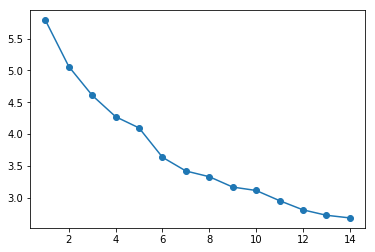

In [933]:
# A loop will be used to plot the explanatory power for up to 10 KMeans clusters
ks = range(1, 15)
inertias = []
tor_mn_venues_grouped_clustering = tor_mn_venues_grouped.drop('Neighborhood', 1)
# tor_mn_venues_grouped_clustering = tor_mn_venues_grouped.drop('Borough', 1)


for k in ks:
    # Initialize the KMeans object using the current number of clusters (k)
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
    # Fit the scaled features to the KMeans object
    km.fit(tor_mn_venues_grouped_clustering)
    # Append the inertia for `km` to the list of inertias
    inertias.append(km.inertia_)
    
# Plot the results in a line plot
plt.plot(ks, inertias, marker='o')

There is an elbow at k=4. There are more sophisticated ways of picking the nuber of clusters which I will utilize later.

In [942]:
# set number of clusters
kclusters = 5

tor_mn_venues_grouped_clustering = tor_mn_venues_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init='k-means++', n_init=10, random_state=0).fit(tor_mn_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
# kmeans.labels_[0:kclusters]

Counter(kmeans.labels_)

Counter({0: 37, 4: 14, 1: 53, 3: 4, 2: 2})

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each borough.

In [944]:
# add clustering labels
tor_mn_venues_sorted.drop('Cluster Labels', axis=1,inplace=True)
tor_mn_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

tor_mn_venues_merged = tor_mn_venues

tor_mn_venues_merged = pd.merge(tor_mn_venues[['Borough','Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude']].drop_duplicates(), 
                     tor_mn_venues_sorted,
                     left_on='Neighborhood',
                     right_on='Neighborhood',
                     how='inner')


print(tor_mn_venues_sorted.shape)
print(tor_mn_venues.shape)
print(tor_mn_venues_merged.shape)
tor_mn_venues_merged.head() # check the last columns!

(110, 12)
(4553, 10)
(112, 15)


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Downtown Toronto,Harbourfront,43.640552,-79.378937,0,Coffee Shop,Café,Hotel,Bakery,Pizza Place,Park,Bistro,Salad Place,Bar,Lounge
1,Downtown Toronto,Regent Park,43.660323,-79.362044,0,Coffee Shop,Thai Restaurant,Rental Car Location,Electronics Store,Performing Arts Venue,Pet Store,Pharmacy,Beer Store,Auto Dealership,Sushi Restaurant
2,Downtown Toronto,Ryerson,43.657659,-79.378802,0,Coffee Shop,Café,Ramen Restaurant,Middle Eastern Restaurant,Clothing Store,Fast Food Restaurant,Theater,Taco Place,Beer Bar,Burger Joint
3,Downtown Toronto,Garden District,43.656898,-79.376122,0,Clothing Store,Coffee Shop,Fast Food Restaurant,Restaurant,Ramen Restaurant,Tea Room,Café,Cosmetics Shop,Theater,Music Venue
4,Downtown Toronto,St. James Town,43.670867,-79.373306,0,Coffee Shop,Grocery Store,Pizza Place,Metro Station,Market,Bakery,Bank,Bar,Convenience Store,Library


Finally, let's visualize the resulting clusters.

In [945]:
tor_mn_venues_merged_tor = tor_mn_venues_merged[tor_mn_venues_merged.Borough.str.contains('Toronto', regex=True)]
print(tor_mn_venues_merged_tor.shape)
tor_mn_venues_merged_tor.to_csv('../data/toronto_venues_clustered.csv')
tor_mn_venues_merged_tor['Cluster Labels'].value_counts()

(72, 15)


0    37
1    17
4    12
3     4
2     2
Name: Cluster Labels, dtype: int64

In [946]:
tor_mn_venues_merged_mn = tor_mn_venues_merged[tor_mn_venues_merged['Borough'] == 'Manhattan']
print(tor_mn_venues_merged_mn.shape)
tor_mn_venues_merged_mn.columns
tor_mn_venues_merged_mn.to_csv('../data/manhattan_venues_clustered.csv')
tor_mn_venues_merged_mn['Cluster Labels'].value_counts()

(40, 15)


1    38
4     2
Name: Cluster Labels, dtype: int64

In [950]:
def makeClusterMap(address, city_data, city, zoom_level):
    
    latitude,longitude = getCoordinate(address)
    m = folium.Map(location=[latitude, longitude], zoom_start= zoom_level, width=1000, height=500)
    
    # set color scheme for the clusters
    x = np.arange(kclusters)
    ys = [i + x + (i*x)**2 for i in range(kclusters)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to the map
    markers_colors = []
    for lat, lon, poi, cluster in zip(city_data['Neighborhood Latitude'], city_data['Neighborhood Longitude'], 
                                      city_data['Neighborhood'], city_data['Cluster Labels']):
        label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster-1],
            fill=True,
            fill_color=rainbow[cluster-1],
            fill_opacity=0.7).add_to(m)
        
        m.save('../plots/%s_cluster_map.html'%city)
    return m

In [952]:
makeClusterMap(address='Manhattan, NY' ,city_data=tor_mn_venues_merged_mn , city= 'manhattan_toronto', zoom_level=11)

In [953]:
makeClusterMap(address='Toronto, Ontario' ,city_data= tor_mn_venues_merged_tor, city= 'toronto_manhattan', zoom_level=12)

Now, we can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, we can also assign a name to each cluster.

In [954]:
for cl in range(0,kclusters):
    tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == cl, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]].reset_index(drop=True).to_html('../tables/toronto_manhattan_cl_{}.html'.format(cl))
    

**Cluster 0**

In [320]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 0, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
49,Swansea,Park,Bus Line,Wine Shop,Massage Studio,Skating Rink,Deli / Bodega,Farm,Ethiopian Restaurant,Event Service,Event Space
224,South Ozone Park,Deli / Bodega,Fast Food Restaurant,Park,Gym / Fitness Center,Sandwich Place,Hotel,Donut Shop,Bar,Food,Food Truck
235,Briarwood,Deli / Bodega,Convenience Store,Mexican Restaurant,Arts & Crafts Store,Coffee Shop,Fast Food Restaurant,Bus Station,Flower Shop,Food,Event Service
246,Broad Channel,Deli / Bodega,Other Nightlife,Park,Pizza Place,Dive Bar,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit
268,Brookville,Deli / Bodega,Zoo,Field,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory
279,South Beach,Deli / Bodega,Pier,Beach,Athletics & Sports,Zoo,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
281,Mariner's Harbor,Italian Restaurant,Deli / Bodega,Other Repair Shop,Furniture / Home Store,Bus Stop,Zoo,Event Service,Event Space,Exhibit,Eye Doctor
314,Arden Heights,Pharmacy,Deli / Bodega,Pizza Place,Coffee Shop,Zoo,Farm,English Restaurant,Ethiopian Restaurant,Event Service,Event Space
329,Elm Park,Deli / Bodega,Ice Cream Shop,Pizza Place,Italian Restaurant,American Restaurant,Bus Stop,Farm,Falafel Restaurant,Factory,Zoo


**Cluster 1**

In [321]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 1, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
32,Roselawn,Trail,Skating Rink,Pharmacy,Zoo,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space
34,Forest Hill North,Trail,Skating Rink,Frozen Yogurt Shop,Bank,Dance Studio,Spa,Pizza Place,Farm,Ethiopian Restaurant,Event Service
35,Forest Hill West,Trail,Skating Rink,Frozen Yogurt Shop,Bank,Dance Studio,Spa,Pizza Place,Farm,Ethiopian Restaurant,Event Service
57,Forest Hill SE,Trail,Skating Rink,Frozen Yogurt Shop,Bank,Dance Studio,Spa,Pizza Place,Farm,Ethiopian Restaurant,Event Service
68,Rosedale,Accessories Store,Playground,Smoke Shop,Pharmacy,Baseball Field,Candy Store,Bus Station,Liquor Store,Park,Jewelry Store
69,Rosedale,Accessories Store,Playground,Smoke Shop,Pharmacy,Baseball Field,Candy Store,Bus Station,Liquor Store,Park,Jewelry Store
76,Wakefield,Food Truck,Pharmacy,Laundromat,Caribbean Restaurant,Dessert Shop,Gas Station,Donut Shop,Ice Cream Shop,Food,Sandwich Place
77,Co-op City,Bus Station,Baseball Field,Accessories Store,Discount Store,Fast Food Restaurant,Gift Shop,Basketball Court,Mattress Store,Grocery Store,Park
79,Fieldston,Music Venue,River,Bus Station,Playground,Plaza,Food,Flower Shop,English Restaurant,Ethiopian Restaurant,Event Service
80,Kingsbridge,Pizza Place,Sandwich Place,Supermarket,Bar,Discount Store,Mexican Restaurant,Bakery,Donut Shop,Latin American Restaurant,Spanish Restaurant


**Cluster 2**

In [322]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 2, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
273,New Brighton,Bus Stop,Park,Deli / Bodega,Playground,Bowling Alley,Discount Store,Convenience Store,Food & Drink Shop,Event Service,Event Space
277,Grymes Hill,Dog Run,Bus Stop,Moving Target,Zoo,Farmers Market,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
287,Oakwood,Bus Station,Bus Stop,Bar,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant
298,Park Hill,Bus Stop,Athletics & Sports,Gym / Fitness Center,Coffee Shop,Hotel,Farmers Market,Ethiopian Restaurant,Event Service,Event Space,Exhibit
300,Graniteville,Supermarket,Wine Bar,Sandwich Place,Bus Stop,Farm,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space
317,Bloomfield,Recreation Center,Park,Theme Park,Discount Store,Bus Stop,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space
356,Willowbrook,Bus Stop,Intersection,Chinese Restaurant,Bagel Shop,Deli / Bodega,Spa,Farmers Market,Event Service,Event Space,Exhibit
376,Fox Hills,Bus Stop,BBQ Joint,Sandwich Place,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor


**Cluster 3**

In [323]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 3, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Harbourfront,Coffee Shop,Café,Hotel,Bakery,Park,Pizza Place,Bubble Tea Shop,Bar,Basketball Stadium,Lounge
1,Regent Park,Coffee Shop,Thai Restaurant,Indian Restaurant,Pub,Food Truck,Sushi Restaurant,Fast Food Restaurant,Beer Store,Electronics Store,Grocery Store
2,Ryerson,Coffee Shop,Café,Clothing Store,Fast Food Restaurant,Ramen Restaurant,Theater,Middle Eastern Restaurant,Pizza Place,Sandwich Place,Bakery
3,Garden District,Coffee Shop,Clothing Store,Restaurant,Fast Food Restaurant,Theater,Café,Cosmetics Shop,Ramen Restaurant,Tea Room,College Rec Center
4,St. James Town,Coffee Shop,Grocery Store,Pizza Place,Convenience Store,Sandwich Place,Food & Drink Shop,Bakery,Bank,Bar,Metro Station
5,The Beaches,Beach,Bar,Tea Room,Japanese Restaurant,Mobile Phone Shop,Café,Salon / Barbershop,Park,Thai Restaurant,Martial Arts Dojo
6,Berczy Park,Café,Coffee Shop,Restaurant,Creperie,Italian Restaurant,Beer Bar,Farmers Market,Japanese Restaurant,Seafood Restaurant,Bakery
7,Central Bay Street,Coffee Shop,Bubble Tea Shop,Clothing Store,Bakery,Spa,Chinese Restaurant,Italian Restaurant,Tea Room,Pizza Place,Seafood Restaurant
8,Christie,Park,Italian Restaurant,Grocery Store,Candy Store,Beer Store,Diner,Coffee Shop,American Restaurant,Café,Japanese Restaurant
9,Adelaide,Coffee Shop,Italian Restaurant,Gastropub,Hotel,Restaurant,Café,Cocktail Bar,Park,Japanese Restaurant,Farmers Market


**Cluster 4**

In [324]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 4, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
51,Summerhill East,Park,Playground,Tennis Court,Zoo,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
59,South Hill,Park,Athletics & Sports,History Museum,Zoo,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit
102,Clason Point,Park,Boat or Ferry,Scenic Lookout,Pool,Bus Stop,South American Restaurant,Grocery Store,Recording Studio,English Restaurant,Ethiopian Restaurant
267,Somerville,Park,Zoo,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop
278,Todt Hill,Park,Zoo,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop
328,Randall Manor,Park,Bagel Shop,Bus Stop,Zoo,Farmers Market,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop
374,Bayswater,Park,Playground,Zoo,Farm,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor


**Cluster 5**

In [325]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 5, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
282,Port Ivory,Bar,Zoo,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory


**Cluster 6**

In [326]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 6, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
151,Mill Island,Lake,Food,Pool,Zoo,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor


**Cluster 7**

In [327]:
tor_mn_venues_merged.loc[tor_mn_venues_merged['Cluster Labels'] == 7, tor_mn_venues_merged.columns[[1] + list(range(5, tor_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
78,Eastchester,Caribbean Restaurant,Metro Station,Deli / Bodega,Diner,Convenience Store,Platform,Pizza Place,Donut Shop,Seafood Restaurant,Chinese Restaurant
84,Williamsbridge,Convenience Store,Nightclub,Bar,Soup Place,Caribbean Restaurant,Food & Drink Shop,Food,Ethiopian Restaurant,Event Service,Event Space
116,Olinville,Fried Chicken Joint,Caribbean Restaurant,Laundromat,Furniture / Home Store,Food,Basketball Court,Chinese Restaurant,Supermarket,Deli / Bodega,Event Service
149,Canarsie,Chinese Restaurant,Caribbean Restaurant,Asian Restaurant,Gym,Bus Line,Zoo,Farmers Market,Event Service,Event Space,Exhibit
240,South Jamaica,Bus Station,Supermarket,Bus Line,Caribbean Restaurant,Bakery,Grocery Store,Park,Flea Market,Factory,Food Stand
241,St. Albans,Caribbean Restaurant,Deli / Bodega,Fast Food Restaurant,Donut Shop,Café,Shopping Mall,Market,Dance Studio,Convenience Store,Motorcycle Shop
244,Cambria Heights,Caribbean Restaurant,Cosmetics Shop,Restaurant,Chinese Restaurant,Bakery,Liquor Store,Pharmacy,Health Food Store,Bus Station,Gym / Fitness Center
263,Laurelton,Caribbean Restaurant,Cosmetics Shop,Train Station,Park,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit
330,Remsen Village,Caribbean Restaurant,Fast Food Restaurant,Coffee Shop,Pharmacy,Breakfast Spot,Supermarket,Sandwich Place,Fried Chicken Joint,Salad Place,Deli / Bodega
371,Erasmus,Caribbean Restaurant,Gym / Fitness Center,Juice Bar,Bar,Bank,Grocery Store,Donut Shop,School,Pharmacy,Health Food Store


## Evaluation & other clustering methods 

In [854]:
metrics.silhouette_score(tor_mn_venues_grouped_clustering, kmeans.labels_, metric='euclidean')

0.08046444450048769

In [929]:
for linkage in  ['ward', 'complete', 'average', 'single']:
    for n_clusters in range(2, 10):
        clustering(data=tor_mn_venues_grouped_clustering, linkage=linkage, n_clusters=n_clusters)

ward 2
Counter({0: 103, 1: 7})
0.43051885017241515
ward 3
Counter({0: 99, 1: 7, 2: 4})
0.42748334724280623
ward 4
Counter({2: 98, 1: 7, 0: 4, 3: 1})
0.4347327738674992
ward 5
Counter({0: 98, 1: 7, 2: 3, 3: 1, 4: 1})
0.39584773398198997
ward 6
Counter({1: 54, 2: 44, 0: 7, 5: 3, 3: 1, 4: 1})
0.07763320704852893
ward 7
Counter({1: 54, 6: 44, 0: 5, 5: 3, 2: 2, 3: 1, 4: 1})
0.07833968567416187
ward 8
Counter({0: 54, 6: 44, 3: 3, 5: 3, 1: 2, 2: 2, 7: 1, 4: 1})
0.08118105604971036
ward 9
Counter({2: 53, 6: 44, 3: 3, 5: 3, 1: 2, 0: 2, 8: 1, 7: 1, 4: 1})
0.08310016035645085
complete 2
Counter({0: 109, 1: 1})
0.5931460806113822
complete 3
Counter({0: 108, 1: 1, 2: 1})
0.5287884613826344
complete 4
Counter({0: 106, 1: 2, 3: 1, 2: 1})
0.5229888032924452
complete 5
Counter({0: 101, 1: 5, 4: 2, 3: 1, 2: 1})
0.3856359177196089
complete 6
Counter({4: 98, 0: 5, 2: 3, 1: 2, 3: 1, 5: 1})
0.3918301340646973
complete 7
Counter({1: 98, 2: 3, 6: 3, 4: 2, 0: 2, 3: 1, 5: 1})
0.3832606819122696
complete 8
Count

In [871]:
metrics.silhouette_score(tor_mn_venues_grouped_clustering, clustering.labels_, metric='euclidean')

0.43051885017241515

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each borough.

In [872]:
# add clustering labels
tor_mn_venues_sorted.drop('Cluster Labels', axis=1,inplace=True)
tor_mn_venues_sorted.insert(0, 'Cluster Labels', clustering.labels_)

tor_mn_venues_merged = tor_mn_venues

tor_mn_venues_merged = pd.merge(tor_mn_venues[['Borough','Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude']].drop_duplicates(), 
                     tor_mn_venues_sorted,
                     left_on='Neighborhood',
                     right_on='Neighborhood',
                     how='inner')


print(tor_mn_venues_sorted.shape)
print(tor_mn_venues.shape)
print(tor_mn_venues_merged.shape)
tor_mn_venues_merged.head() # check the last columns!

(110, 12)
(4553, 8)
(112, 15)


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Downtown Toronto,Harbourfront,43.640552,-79.378937,0,Coffee Shop,Café,Hotel,Bakery,Pizza Place,Park,Bistro,Salad Place,Bar,Lounge
1,Downtown Toronto,Regent Park,43.660323,-79.362044,0,Coffee Shop,Thai Restaurant,Rental Car Location,Electronics Store,Performing Arts Venue,Pet Store,Pharmacy,Beer Store,Auto Dealership,Sushi Restaurant
2,Downtown Toronto,Ryerson,43.657658,-79.378802,0,Coffee Shop,Café,Ramen Restaurant,Middle Eastern Restaurant,Clothing Store,Fast Food Restaurant,Theater,Taco Place,Beer Bar,Burger Joint
3,Downtown Toronto,Garden District,43.656898,-79.376122,0,Clothing Store,Coffee Shop,Fast Food Restaurant,Restaurant,Ramen Restaurant,Tea Room,Café,Cosmetics Shop,Theater,Music Venue
4,Downtown Toronto,St. James Town,43.670867,-79.373306,0,Coffee Shop,Grocery Store,Pizza Place,Metro Station,Market,Bakery,Bank,Bar,Convenience Store,Library


Finally, let's visualize the resulting clusters.

In [873]:
tor_mn_venues_merged_tor = tor_mn_venues_merged[tor_mn_venues_merged.Borough.str.contains('Toronto', regex=True)]
print(tor_mn_venues_merged_tor.shape)
tor_mn_venues_merged_tor.to_csv('../data/toronto_venues_clustered.csv')
tor_mn_venues_merged_tor['Cluster Labels'].value_counts()

(72, 15)


0    65
1     7
Name: Cluster Labels, dtype: int64

In [874]:
tor_mn_venues_merged_mn = tor_mn_venues_merged[tor_mn_venues_merged['Borough'] == 'Manhattan']
print(tor_mn_venues_merged_mn.shape)
tor_mn_venues_merged_mn.columns
tor_mn_venues_merged_mn.to_csv('../data/manhattan_venues_clustered.csv')
tor_mn_venues_merged_mn['Cluster Labels'].value_counts()

(40, 15)


0    40
Name: Cluster Labels, dtype: int64

In [875]:
makeClusterMap(address='Manhattan, NY' ,city_data=tor_mn_venues_merged_mn , city= 'manhattan_toronto', zoom_level=11)

In [876]:
makeClusterMap(address='Toronto, Ontario' ,city_data= tor_mn_venues_merged_tor, city= 'toronto_manhattan', zoom_level=12)

# Brooklyn-Manhattan Analysis

Combining the data frames for data analysis.

**????????**

In [955]:
br_mn_venues = pd.concat([br_venues, mn_venues], axis=0, ignore_index=True)

#one of the venue categories is "Neighborhood", changed it to prevent conflict later.
br_mn_venues['Venue Category'].replace('Neighborhood','Neighborhood_venu', inplace=True)
print(br_mn_venues.shape)
br_mn_venues.head()

(5311, 10)


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Unnamed: 0,Unnamed: 0.1,Venue,Venue Category,Venue Latitude,Venue Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621,2162,NaN,Pilo Arts Day Spa and Salon,Spa,40.624748,-74.030591
1,Brooklyn,Bay Ridge,40.625801,-74.030621,2163,NaN,Bagel Boy,Bagel Shop,40.627896,-74.029335
2,Brooklyn,Bay Ridge,40.625801,-74.030621,2164,NaN,Pegasus Cafe,Breakfast Spot,40.623168,-74.031186
3,Brooklyn,Bay Ridge,40.625801,-74.030621,2165,NaN,Cocoa Grinder,Juice Bar,40.623967,-74.030863
4,Brooklyn,Bay Ridge,40.625801,-74.030621,2166,NaN,Ho' Brah Taco Joint,Taco Place,40.622960,-74.031371


**Look at 277 uniqure categories of manhattan vs 268 of toronto. see how different they are.**

In [956]:
print(len(br_venues['Venue Category'].unique()))
print(len(mn_venues['Venue Category'].unique()))
print(len(br_mn_venues['Venue Category'].unique()))

294
268
359


## Analyzing each neighborhood

In [957]:
br_mn_venues_one_hot = pd.get_dummies(br_mn_venues['Venue Category'])
print(br_mn_venues_one_hot.shape)
br_mn_venues_one_hot.head()

(5311, 359)


,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Volleyball Court,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [958]:
# add columns to the new dataframe
br_mn_venues_one_hot[['Neighborhood']] = br_mn_venues[['Neighborhood']]

# move borough... columns to the beginning
new_cols_order = list(br_mn_venues_one_hot.columns[-1:]) + list(br_mn_venues_one_hot.columns[:-1]) 

br_mn_venues_one_hot = br_mn_venues_one_hot[new_cols_order]

# or
# tor_mn_venues_one_hot.insert(0, 'Borough', tor_mn_venues['Borough'])
# tor_mn_venues_one_hot.insert(1, 'Neighborhood', tor_mn_venues['Neighborhood'])

print(br_mn_venues_one_hot.shape)
br_mn_venues_one_hot.head()

(5311, 360)


,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,...,Volleyball Court,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category.

In [959]:
br_mn_venues_grouped = br_mn_venues_one_hot.groupby('Neighborhood').mean().reset_index()
print(br_mn_venues_grouped.shape)
br_mn_venues_grouped.head()

(110, 360)


,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,...,Volleyball Court,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,Bath Beach,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,...,0.0,0.02,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00
1,Battery Park City,0.0,0.0,0.0,0.02,0.0,0.0,0.0,0.0,0.00,...,0.0,0.00,0.0,0.0,0.00,0.04,0.0,0.0,0.0,0.00
2,Bay Ridge,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.00,...,0.0,0.00,0.0,0.0,0.02,0.00,0.0,0.0,0.0,0.00
3,Bedford Stuyvesant,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.02,...,0.0,0.00,0.0,0.0,0.00,0.06,0.0,0.0,0.0,0.02
4,Bensonhurst,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,...,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00


Let's print each neighborhood along with the top 5 most common venues.

In [960]:
num_top_venues = 5

for hood in br_mn_venues_grouped['Neighborhood'][0:5]:
    print("----"+hood+"----")
    temp = br_mn_venues_grouped[br_mn_venues_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Bath Beach----
                  venue  freq
0           Pizza Place  0.10
1  Cantonese Restaurant  0.06
2                Bakery  0.06
3       Bubble Tea Shop  0.06
4      Sushi Restaurant  0.06


----Battery Park City----
           venue  freq
0           Park  0.12
1    Coffee Shop  0.08
2  Memorial Site  0.06
3          Plaza  0.06
4     Food Court  0.04


----Bay Ridge----
                venue  freq
0                 Spa  0.10
1         Pizza Place  0.10
2  Italian Restaurant  0.06
3       Grocery Store  0.04
4  Chinese Restaurant  0.04


----Bedford Stuyvesant----
                  venue  freq
0           Coffee Shop  0.10
1                   Bar  0.10
2             Wine Shop  0.06
3  Caribbean Restaurant  0.06
4                  Café  0.04


----Bensonhurst----
                venue  freq
0         Pizza Place  0.10
1              Bakery  0.08
2  Italian Restaurant  0.06
3      Ice Cream Shop  0.06
4          Bagel Shop  0.06




In [961]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [962]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
br_mn_venues_sorted = pd.DataFrame(columns=columns)
br_mn_venues_sorted['Neighborhood'] = br_mn_venues_grouped['Neighborhood']

for ind in np.arange(br_mn_venues_grouped.shape[0]):
    br_mn_venues_sorted.iloc[ind, 1:] = return_most_common_venues(br_mn_venues_grouped.iloc[ind, :], num_top_venues)

br_mn_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bath Beach,Pizza Place,Italian Restaurant,Sushi Restaurant,Bubble Tea Shop,Cantonese Restaurant,Coffee Shop,Bakery,Japanese Restaurant,Supplement Shop,Chinese Restaurant
1,Battery Park City,Park,Coffee Shop,Memorial Site,Plaza,Wine Shop,Food Court,Shopping Mall,Cooking School,Performing Arts Venue,Pizza Place
2,Bay Ridge,Spa,Pizza Place,Italian Restaurant,Grocery Store,Greek Restaurant,Chinese Restaurant,Cosmetics Shop,Bakery,Bar,Hookah Bar
3,Bedford Stuyvesant,Bar,Coffee Shop,Wine Shop,Caribbean Restaurant,Pizza Place,Juice Bar,Café,Yoga Studio,Mexican Restaurant,Gift Shop
4,Bensonhurst,Pizza Place,Bakery,Ice Cream Shop,Bagel Shop,Italian Restaurant,Chinese Restaurant,Coffee Shop,Cantonese Restaurant,Supplement Shop,Bank


## Clustering Neighborhoods

Now, I'm going to run  k-means to cluster the boroughs. I use the elbow method to find the best number of clusters.

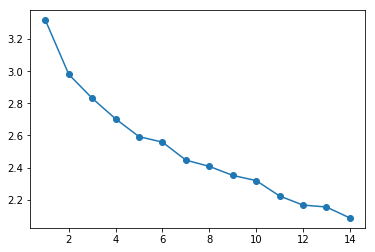

In [963]:
# A loop will be used to plot the explanatory power for up to 10 KMeans clusters
ks = range(1, 15)
inertias = []
br_mn_venues_grouped_clustering = br_mn_venues_grouped.drop('Neighborhood', 1)
# br_mn_venues_grouped_clustering = br_mn_venues_grouped.drop('Borough', 1)


for k in ks:
    # Initialize the KMeans object using the current number of clusters (k)
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
    # Fit the scaled features to the KMeans object
    km.fit(br_mn_venues_grouped_clustering)
    # Append the inertia for `km` to the list of inertias
    inertias.append(km.inertia_)
    
# Plot the results in a line plot
plt.plot(ks, inertias, marker='o')

There isn't a clear elbow. For now I pic k=5. There are more sophisticated ways of picking the nuber of clusters which I will utilize later.

In [964]:
# set number of clusters
kclusters = 5

# br_mn_venues_grouped_clustering = br_mn_venues_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init='k-means++', n_init=10, random_state=0).fit(br_mn_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
# kmeans.labels_[0:kclusters]

Counter(kmeans.labels_)

Counter({0: 18, 1: 45, 4: 29, 3: 17, 2: 1})

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each borough.

In [965]:
# add clustering labels
# br_mn_venues_sorted.drop('Cluster Labels', axis=1,inplace=True)
br_mn_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

br_mn_venues_merged = br_mn_venues

br_mn_venues_merged = pd.merge(br_mn_venues[['Borough','Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude']].drop_duplicates(), 
                     br_mn_venues_sorted,
                     left_on='Neighborhood',
                     right_on='Neighborhood',
                     how='inner')


print(br_mn_venues_sorted.shape)
print(br_mn_venues.shape)
print(br_mn_venues_merged.shape)
br_mn_venues_merged.head() # check the last columns!

(110, 12)
(5311, 10)
(110, 15)


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Brooklyn,Bay Ridge,40.625801,-74.030621,0,Spa,Pizza Place,Italian Restaurant,Grocery Store,Greek Restaurant,Chinese Restaurant,Cosmetics Shop,Bakery,Bar,Hookah Bar
1,Brooklyn,Bensonhurst,40.611009,-73.995180,0,Pizza Place,Bakery,Ice Cream Shop,Bagel Shop,Italian Restaurant,Chinese Restaurant,Coffee Shop,Cantonese Restaurant,Supplement Shop,Bank
2,Brooklyn,Sunset Park,40.645103,-74.010316,4,Bakery,Mexican Restaurant,Latin American Restaurant,Pizza Place,Bank,Vietnamese Restaurant,Spanish Restaurant,Chinese Restaurant,Café,Record Shop
3,Brooklyn,Greenpoint,40.730201,-73.954241,4,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Café,French Restaurant,Mexican Restaurant,Yoga Studio,Furniture / Home Store,Salon / Barbershop
4,Brooklyn,Gravesend,40.595260,-73.973471,0,Pizza Place,Donut Shop,Bakery,Bagel Shop,Pool Hall,Bank,Bar,Pharmacy,Supermarket,Lounge


Finally, let's visualize the resulting clusters.

In [966]:
br_mn_venues_merged_mn = br_mn_venues_merged[br_mn_venues_merged['Borough'] == 'Manhattan']
print(br_mn_venues_merged_mn.shape)
br_mn_venues_merged_mn.columns
br_mn_venues_merged_mn.to_csv('../data/manhattan_brooklyn_venues_clustered.csv')
br_mn_venues_merged_mn['Cluster Labels'].value_counts()

(40, 15)


1    30
4    10
Name: Cluster Labels, dtype: int64

In [967]:
br_mn_venues_merged_br = br_mn_venues_merged[br_mn_venues_merged['Borough'] == 'Brooklyn']
print(br_mn_venues_merged_br.shape)
br_mn_venues_merged_br.columns
br_mn_venues_merged_br.to_csv('../data/brooklyn_manhattan_venues_clustered.csv')
br_mn_venues_merged_br['Cluster Labels'].value_counts()

(70, 15)


4    19
0    18
3    17
1    15
2     1
Name: Cluster Labels, dtype: int64

In [968]:
makeClusterMap(address='Brooklyn, NY' ,city_data=br_mn_venues_merged_br , city= 'brooklyn_manhattan', zoom_level=11)

In [969]:
makeClusterMap(address='Manhattan, NY' ,city_data= br_mn_venues_merged_mn, city= 'manhattan_brooklyn', zoom_level=11)

## Examining Clusters

First, I'm going to save the dataframes into html files for later use.

In [534]:
for cl in range(0,kclusters):
    br_mn_venues_merged.loc[br_mn_venues_merged['Cluster Labels'] == cl, br_mn_venues_merged.columns[[1] + list(range(5, br_mn_venues_merged.shape[1]))]].reset_index(drop=True).to_html('../tables/brooklyn_manhattan_cl_{}.html'.format(cl))
    
    

Now, we can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, we can also assign a name to each cluster.

**Cluster 0**

In [970]:
br_mn_venues_merged.loc[br_mn_venues_merged['Cluster Labels'] == 0, br_mn_venues_merged.columns[[1] + list(range(5, br_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bay Ridge,Spa,Pizza Place,Italian Restaurant,Grocery Store,Greek Restaurant,Chinese Restaurant,Cosmetics Shop,Bakery,Bar,Hookah Bar
1,Bensonhurst,Pizza Place,Bakery,Ice Cream Shop,Bagel Shop,Italian Restaurant,Chinese Restaurant,Coffee Shop,Cantonese Restaurant,Supplement Shop,Bank
4,Gravesend,Pizza Place,Donut Shop,Bakery,Bagel Shop,Pool Hall,Bank,Bar,Pharmacy,Supermarket,Lounge
6,Sheepshead Bay,Turkish Restaurant,Italian Restaurant,Sushi Restaurant,Pizza Place,Sandwich Place,Russian Restaurant,Grocery Store,Dessert Shop,Restaurant,Café
7,Manhattan Terrace,Pizza Place,Pharmacy,Bagel Shop,Grocery Store,Sushi Restaurant,Donut Shop,Mobile Phone Shop,Bank,Steakhouse,Turkish Restaurant
27,Starrett City,Pizza Place,Department Store,Women's Store,Furniture / Home Store,Mobile Phone Shop,Kids Store,Discount Store,Clothing Store,Pharmacy,Shoe Store
33,Bath Beach,Pizza Place,Italian Restaurant,Sushi Restaurant,Bubble Tea Shop,Cantonese Restaurant,Coffee Shop,Bakery,Japanese Restaurant,Supplement Shop,Chinese Restaurant
34,Borough Park,Pizza Place,Bank,Grocery Store,Pharmacy,Bakery,Steakhouse,Coffee Shop,Sandwich Place,Supermarket,Restaurant
35,Dyker Heights,Pizza Place,Gym / Fitness Center,Cosmetics Shop,Japanese Restaurant,Middle Eastern Restaurant,Department Store,Chinese Restaurant,Bar,Bakery,Noodle House
36,Gerritsen Beach,Pizza Place,Donut Shop,Ice Cream Shop,Deli / Bodega,Convenience Store,Bar,Bagel Shop,Sandwich Place,Russian Restaurant,Seafood Restaurant


**Cluster 1**

In [971]:
br_mn_venues_merged.loc[br_mn_venues_merged['Cluster Labels'] == 1, br_mn_venues_merged.columns[[1] + list(range(5, br_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,Brighton Beach,Bakery,Food Truck,Eastern European Restaurant,Russian Restaurant,Grocery Store,Mobile Phone Shop,Restaurant,Beach,Neighborhood_venu,Sushi Restaurant
18,Brooklyn Heights,Park,Yoga Studio,Italian Restaurant,American Restaurant,Scenic Lookout,Gym,Pet Store,Coffee Shop,Ice Cream Shop,History Museum
19,Cobble Hill,Yoga Studio,Italian Restaurant,Bar,Ice Cream Shop,Playground,Cocktail Bar,Bakery,Wine Shop,Bagel Shop,Seafood Restaurant
21,Red Hook,Bar,Park,Seafood Restaurant,Flower Shop,Café,New American Restaurant,Wine Shop,American Restaurant,Brewery,Farm
23,Fort Greene,Italian Restaurant,Flower Shop,Coffee Shop,Theater,Cocktail Bar,Pizza Place,New American Restaurant,French Restaurant,Opera House,Market
24,Park Slope,Ice Cream Shop,Coffee Shop,Bagel Shop,Gift Shop,Furniture / Home Store,Frozen Yogurt Shop,Japanese Restaurant,Bakery,American Restaurant,Pub
30,Mill Island,Gym,Pizza Place,Harbor / Marina,Burger Joint,Pool,Seafood Restaurant,Stables,Bowling Alley,Middle Eastern Restaurant,Chinese Restaurant
31,Manhattan Beach,Italian Restaurant,Turkish Restaurant,Sandwich Place,Café,Dessert Shop,Seafood Restaurant,Eastern European Restaurant,Bus Stop,Pizza Place,Bar
32,Coney Island,Theme Park Ride / Attraction,Beach,Hot Dog Joint,Ice Cream Shop,Pizza Place,Theme Park,Arcade,Caribbean Restaurant,Candy Store,Museum
41,Boerum Hill,Coffee Shop,Bar,Yoga Studio,Theater,Performing Arts Venue,Opera House,Grocery Store,Chinese Restaurant,Cocktail Bar,Seafood Restaurant


**Cluster 2**

In [972]:
br_mn_venues_merged.loc[br_mn_venues_merged['Cluster Labels'] == 2, br_mn_venues_merged.columns[[1] + list(range(5, br_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
39,Sea Gate,Beach,Supermarket,Home Service,Fried Chicken Joint,Bus Station,Bus Stop,Spa,Basketball Court,Pharmacy,Donut Shop


**Cluster 3**

In [973]:
br_mn_venues_merged.loc[br_mn_venues_merged['Cluster Labels'] == 3, br_mn_venues_merged.columns[[1] + list(range(5, br_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,East Flatbush,Caribbean Restaurant,Discount Store,Lounge,Grocery Store,Supermarket,Food Truck,Business Service,Deli / Bodega,Furniture / Home Store,Mobile Phone Shop
14,Brownsville,Pizza Place,Discount Store,Sandwich Place,Supermarket,Gas Station,Mobile Phone Shop,Fried Chicken Joint,Fast Food Restaurant,Caribbean Restaurant,Grocery Store
25,Cypress Hills,Donut Shop,Fast Food Restaurant,Latin American Restaurant,Pizza Place,Grocery Store,Chinese Restaurant,Ice Cream Shop,Discount Store,Shoe Store,Fried Chicken Joint
26,East New York,Pizza Place,Sandwich Place,Chinese Restaurant,Supermarket,Donut Shop,Food Truck,Furniture / Home Store,Spanish Restaurant,Fast Food Restaurant,Metro Station
28,Canarsie,Caribbean Restaurant,Pizza Place,Bank,Pharmacy,Mexican Restaurant,Gym / Fitness Center,Gym,Grocery Store,Shop & Service,Chinese Restaurant
29,Flatlands,Caribbean Restaurant,Supermarket,Pharmacy,Mobile Phone Shop,Discount Store,Fast Food Restaurant,Fried Chicken Joint,Lounge,Donut Shop,Sandwich Place
43,Ocean Hill,Discount Store,Fried Chicken Joint,Donut Shop,Café,Southern / Soul Food Restaurant,Pizza Place,Sandwich Place,Fast Food Restaurant,Coffee Shop,Ice Cream Shop
44,City Line,Pizza Place,Supermarket,Fast Food Restaurant,Donut Shop,Discount Store,Food Truck,Shoe Store,South American Restaurant,Bank,Grocery Store
45,Bergen Beach,Donut Shop,Sushi Restaurant,Playground,Stables,Peruvian Restaurant,Chinese Restaurant,Harbor / Marina,Pizza Place,Supermarket,Deli / Bodega
55,Wingate,Caribbean Restaurant,Pizza Place,Donut Shop,Deli / Bodega,Bagel Shop,Ice Cream Shop,Fried Chicken Joint,Discount Store,Café,Grocery Store


**Cluster 4**

In [974]:
br_mn_venues_merged.loc[br_mn_venues_merged['Cluster Labels'] == 4, br_mn_venues_merged.columns[[1] + list(range(5, br_mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Sunset Park,Bakery,Mexican Restaurant,Latin American Restaurant,Pizza Place,Bank,Vietnamese Restaurant,Spanish Restaurant,Chinese Restaurant,Café,Record Shop
3,Greenpoint,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Café,French Restaurant,Mexican Restaurant,Yoga Studio,Furniture / Home Store,Salon / Barbershop
8,Flatbush,Caribbean Restaurant,Bar,Mexican Restaurant,Coffee Shop,Pizza Place,Café,Deli / Bodega,Health Food Store,Middle Eastern Restaurant,Tapas Restaurant
9,Crown Heights,Café,Coffee Shop,Pizza Place,Caribbean Restaurant,Cocktail Bar,Juice Bar,Bakery,Museum,Yoga Studio,Sushi Restaurant
11,Kensington,Pizza Place,Thai Restaurant,Ice Cream Shop,Grocery Store,Café,Bakery,Mexican Restaurant,Sandwich Place,Japanese Restaurant,Food & Drink Shop
12,Windsor Terrace,Wine Shop,Café,Bar,Park,Italian Restaurant,Diner,Playground,Deli / Bodega,Antique Shop,Chinese Restaurant
13,Prospect Heights,Bar,Cocktail Bar,Southern / Soul Food Restaurant,New American Restaurant,Thai Restaurant,Ice Cream Shop,Wine Shop,Beer Bar,Pizza Place,Café
15,Williamsburg,Pizza Place,Wine Bar,Bar,Coffee Shop,Mediterranean Restaurant,Cocktail Bar,Yoga Studio,Liquor Store,Lounge,Mexican Restaurant
16,Bushwick,Bar,Mexican Restaurant,Pizza Place,Coffee Shop,Bakery,Latin American Restaurant,Thrift / Vintage Store,French Restaurant,Café,Deli / Bodega
17,Bedford Stuyvesant,Bar,Coffee Shop,Wine Shop,Caribbean Restaurant,Pizza Place,Juice Bar,Café,Yoga Studio,Mexican Restaurant,Gift Shop


## Evaluation & other clustering methods 

In [980]:
metrics.silhouette_score(br_mn_venues_grouped_clustering, kmeans.labels_, metric='euclidean')

0.06557877196495805

In [982]:
# for linkage in  ['ward', 'complete', 'average', 'single']:
#     for n_clusters in range(2, 10):
#         clustering(data=br_mn_venues_grouped_clustering, linkage=linkage, n_clusters=n_clusters)

In [984]:
# metrics.silhouette_score(br_mn_venues_grouped_clustering, clustering.labels_, metric='euclidean')

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each borough.

In [987]:
# # add clustering labels
# br_mn_venues_sorted.drop('Cluster Labels', axis=1,inplace=True)
# br_mn_venues_sorted.insert(0, 'Cluster Labels', clustering.labels_)

# br_mn_venues_merged = br_mn_venues

# br_mn_venues_merged = pd.merge(br_mn_venues[['Borough','Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude']].drop_duplicates(), 
#                      br_mn_venues_sorted,
#                      left_on='Neighborhood',
#                      right_on='Neighborhood',
#                      how='inner')


# print(br_mn_venues_sorted.shape)
# print(br_mn_venues.shape)
# print(br_mn_venues_merged.shape)
# br_mn_venues_merged.head() # check the last columns!

Finally, let's visualize the resulting clusters.

In [988]:
br_mn_venues_merged_mn = br_mn_venues_merged[br_mn_venues_merged['Borough'] == 'Manhattan']
print(br_mn_venues_merged_mn.shape)
br_mn_venues_merged_mn.columns
br_mn_venues_merged_mn.to_csv('../data/manhattan_brooklyn_venues_clustered.csv')
br_mn_venues_merged_mn['Cluster Labels'].value_counts()

(40, 15)


1    30
4    10
Name: Cluster Labels, dtype: int64

In [989]:
br_mn_venues_merged_br = br_mn_venues_merged[br_mn_venues_merged['Borough'] == 'Brooklyn']
print(br_mn_venues_merged_br.shape)
br_mn_venues_merged_br.columns
br_mn_venues_merged_br.to_csv('../data/brooklyn_manhattan_venues_clustered.csv')
br_mn_venues_merged_br['Cluster Labels'].value_counts()

(70, 15)


4    19
0    18
3    17
1    15
2     1
Name: Cluster Labels, dtype: int64

In [990]:
makeClusterMap(address='Brooklyn, NY' ,city_data=br_mn_venues_merged_br , city= 'brooklyn_manhattan', zoom_level=11)

In [883]:
makeClusterMap(address='Manhattan, NY' ,city_data= br_mn_venues_merged_mn, city= 'manhattan_brooklyn', zoom_level=11)

# Manhattan Analysis

## Analyzing each neighborhood

In [904]:
mn_venues_one_hot = pd.get_dummies(mn_venues['Venue Category'])
print(mn_venues_one_hot.shape)
mn_venues_one_hot.head()

(2000, 268)


,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,...,Video Store,Vietnamese Restaurant,Volleyball Court,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [905]:
# add columns to the new dataframe
mn_venues_one_hot[['Neighborhood']] = mn_venues[['Neighborhood']]

# move borough... columns to the beginning
new_cols_order = list(mn_venues_one_hot.columns[-1:]) + list(mn_venues_one_hot.columns[:-1]) 

mn_venues_one_hot = mn_venues_one_hot[new_cols_order]

# or
# mn_venues_one_hot.insert(0, 'Borough', mn_venues['Borough'])
# mn_venues_one_hot.insert(1, 'Neighborhood', mn_venues['Neighborhood'])

print(mn_venues_one_hot.shape)
mn_venues_one_hot.head()

(2000, 269)


,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Video Store,Vietnamese Restaurant,Volleyball Court,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category.

In [906]:
mn_venues_grouped = mn_venues_one_hot.groupby('Neighborhood').mean().reset_index()
print(mn_venues_grouped.shape)
mn_venues_grouped.head()

(40, 269)


,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Video Store,Vietnamese Restaurant,Volleyball Court,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Battery Park City,0.0,0.0,0.00,0.02,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.04,0.0,0.00,0.00
1,Carnegie Hill,0.0,0.0,0.00,0.04,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.02,0.06,0.0,0.00,0.06
2,Central Harlem,0.0,0.0,0.06,0.04,0.0,0.0,0.0,0.0,0.02,...,0.0,0.0,0.0,0.0,0.0,0.00,0.02,0.0,0.00,0.02
3,Chelsea,0.0,0.0,0.00,0.06,0.0,0.0,0.0,0.0,0.02,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.02,0.00
4,Chinatown,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.04,0.00,0.0,0.00,0.00


Let's print each neighborhood along with the top 5 most common venues.

In [907]:
num_top_venues = 5

for hood in mn_venues_grouped['Neighborhood'][0:5]:
    print("----"+hood+"----")
    temp = mn_venues_grouped[mn_venues_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Battery Park City----
           venue  freq
0           Park  0.12
1    Coffee Shop  0.08
2  Memorial Site  0.06
3          Plaza  0.06
4      Wine Shop  0.04


----Carnegie Hill----
         venue  freq
0  Coffee Shop  0.08
1  Yoga Studio  0.06
2    Bookstore  0.06
3    Wine Shop  0.06
4          Spa  0.06


----Central Harlem----
                 venue  freq
0   African Restaurant  0.06
1       Cosmetics Shop  0.04
2  American Restaurant  0.04
3    French Restaurant  0.04
4   Seafood Restaurant  0.04


----Chelsea----
                 venue  freq
0  American Restaurant  0.06
1          Coffee Shop  0.06
2   Seafood Restaurant  0.06
3       Ice Cream Shop  0.06
4   Italian Restaurant  0.04


----Chinatown----
                 venue  freq
0       Ice Cream Shop  0.08
1         Cocktail Bar  0.06
2  Dumpling Restaurant  0.04
3         Gourmet Shop  0.04
4   Chinese Restaurant  0.04




In [908]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [909]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
mn_venues_sorted = pd.DataFrame(columns=columns)
mn_venues_sorted['Neighborhood'] = mn_venues_grouped['Neighborhood']

for ind in np.arange(mn_venues_grouped.shape[0]):
    mn_venues_sorted.iloc[ind, 1:] = return_most_common_venues(mn_venues_grouped.iloc[ind, :], num_top_venues)

mn_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Battery Park City,Park,Coffee Shop,Memorial Site,Plaza,Food Court,Shopping Mall,Wine Shop,Electronics Store,Mexican Restaurant,Garden
1,Carnegie Hill,Coffee Shop,Yoga Studio,Wine Shop,Spa,Bookstore,Art Museum,Gym / Fitness Center,Gym,French Restaurant,Pizza Place
2,Central Harlem,African Restaurant,Coffee Shop,American Restaurant,French Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant,Bar,Pizza Place,Cosmetics Shop,Chinese Restaurant
3,Chelsea,Ice Cream Shop,Coffee Shop,American Restaurant,Seafood Restaurant,Theater,Italian Restaurant,Cycle Studio,Scenic Lookout,Sandwich Place,Butcher
4,Chinatown,Ice Cream Shop,Cocktail Bar,Dumpling Restaurant,Wine Bar,Coffee Shop,Gourmet Shop,Chinese Restaurant,Sandwich Place,Seafood Restaurant,Pizza Place


## Clustering Neighborhoods

Now, I'm going to run  k-means to cluster the boroughs. I use the elbow method to find the best number of clusters.

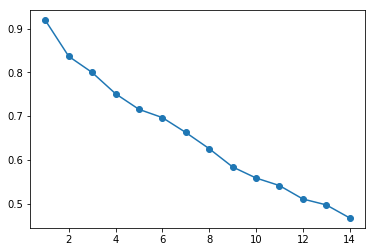

In [910]:
# A loop will be used to plot the explanatory power for up to 10 KMeans clusters
ks = range(1, 15)
inertias = []
mn_venues_grouped_clustering = mn_venues_grouped.drop('Neighborhood', 1)
# mn_venues_grouped_clustering = mn_venues_grouped.drop('Borough', 1)


for k in ks:
    # Initialize the KMeans object using the current number of clusters (k)
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
    # Fit the scaled features to the KMeans object
    km.fit(mn_venues_grouped_clustering)
    # Append the inertia for `km` to the list of inertias
    inertias.append(km.inertia_)
    
# Plot the results in a line plot
plt.plot(ks, inertias, marker='o')

There isn't a clear elbow. I choose k=5 for now. There are more sophisticated ways of picking the nuber of clusters which I will utilize later.

In [911]:
# set number of clusters
kclusters = 5

mn_venues_grouped_clustering = mn_venues_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init='k-means++', n_init=10, random_state=0).fit(mn_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
# kmeans.labels_[0:kclusters]

Counter(kmeans.labels_)

Counter({4: 4, 2: 8, 0: 13, 3: 12, 1: 3})

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each borough.

In [912]:
# add clustering labels
# mn_venues_sorted.drop('Cluster Labels', axis=1,inplace=True)
mn_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

mn_venues_merged = mn_venues

mn_venues_merged = pd.merge(mn_venues[['Borough','Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude']].drop_duplicates(), 
                     mn_venues_sorted,
                     left_on='Neighborhood',
                     right_on='Neighborhood',
                     how='inner')


print(mn_venues_sorted.shape)
print(mn_venues.shape)
print(mn_venues_merged.shape)
# mn_venues_merged.head() # check the last columns!
mn_venues_sorted.head(10)

(40, 12)
(2000, 10)
(40, 15)


,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4,Battery Park City,Park,Coffee Shop,Memorial Site,Plaza,Food Court,Shopping Mall,Wine Shop,Electronics Store,Mexican Restaurant,Garden
1,2,Carnegie Hill,Coffee Shop,Yoga Studio,Wine Shop,Spa,Bookstore,Art Museum,Gym / Fitness Center,Gym,French Restaurant,Pizza Place
2,0,Central Harlem,African Restaurant,Coffee Shop,American Restaurant,French Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant,Bar,Pizza Place,Cosmetics Shop,Chinese Restaurant
3,3,Chelsea,Ice Cream Shop,Coffee Shop,American Restaurant,Seafood Restaurant,Theater,Italian Restaurant,Cycle Studio,Scenic Lookout,Sandwich Place,Butcher
4,0,Chinatown,Ice Cream Shop,Cocktail Bar,Dumpling Restaurant,Wine Bar,Coffee Shop,Gourmet Shop,Chinese Restaurant,Sandwich Place,Seafood Restaurant,Pizza Place
5,2,Civic Center,French Restaurant,American Restaurant,Hotel,Yoga Studio,Gym / Fitness Center,Coffee Shop,Cocktail Bar,Spa,Café,Hotel Bar
6,1,Clinton,Gym / Fitness Center,Theater,American Restaurant,Bakery,Sandwich Place,Indie Theater,Wine Shop,Café,Spa,Caucasian Restaurant
7,0,East Harlem,Mexican Restaurant,Bakery,Latin American Restaurant,Thai Restaurant,Park,Cocktail Bar,Taco Place,Garden,French Restaurant,Fountain
8,0,East Village,Bar,Wine Bar,Pizza Place,Japanese Restaurant,Ice Cream Shop,Korean Restaurant,Chinese Restaurant,Juice Bar,Seafood Restaurant,Greek Restaurant
9,3,Financial District,Coffee Shop,Gym,Steakhouse,Pizza Place,Japanese Restaurant,Gym / Fitness Center,Jewelry Store,Event Space,Falafel Restaurant,Spa


Finally, let's visualize the resulting clusters.

In [923]:
makeClusterMap(address='Manhattan, NY' ,city_data=mn_venues_merged , city= 'manhattan', zoom_level=11)



## Examining Clusters

Now, we can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, we can also assign a name to each cluster.

First, I'm going to save the dataframes into html files for later use.

In [481]:
for cl in range(0,kclusters):
    mn_venues_merged.loc[mn_venues_merged['Cluster Labels'] == cl, mn_venues_merged.columns[[1] + list(range(5, mn_venues_merged.shape[1]))]].reset_index(drop=True).to_html('../tables/manhattan_cl_{}.html'.format(cl))

**Cluster 0**

In [479]:
mn_cl_0 = mn_venues_merged.loc[mn_venues_merged['Cluster Labels'] == 0, mn_venues_merged.columns[[1] + list(range(5, mn_venues_merged.shape[1]))]].reset_index(drop=True)
mn_cl_0.to_html('../tables/m_cl_0.html')
mn_cl_0

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Marble Hill,Pizza Place,Café,Sandwich Place,Mexican Restaurant,Park,Coffee Shop,Discount Store,Supermarket,Donut Shop,Lounge
1,Chinatown,Ice Cream Shop,Cocktail Bar,Dumpling Restaurant,Wine Bar,Coffee Shop,Gourmet Shop,Chinese Restaurant,Sandwich Place,Seafood Restaurant,Pizza Place
2,Washington Heights,Tapas Restaurant,Pizza Place,Park,Wine Shop,Mexican Restaurant,Latin American Restaurant,New American Restaurant,Café,Ramen Restaurant,Caribbean Restaurant
3,Inwood,Café,Mexican Restaurant,Wine Bar,Deli / Bodega,Pizza Place,Bakery,Latin American Restaurant,Park,Restaurant,Seafood Restaurant
4,Hamilton Heights,Bar,Coffee Shop,Mexican Restaurant,Café,Yoga Studio,Cocktail Bar,Park,Sushi Restaurant,Italian Restaurant,Bakery
5,Manhattanville,Park,Italian Restaurant,Mexican Restaurant,American Restaurant,Café,Cocktail Bar,Yoga Studio,Jazz Club,Latin American Restaurant,Lounge
6,Central Harlem,African Restaurant,Coffee Shop,American Restaurant,French Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant,Bar,Pizza Place,Cosmetics Shop,Chinese Restaurant
7,East Harlem,Mexican Restaurant,Bakery,Latin American Restaurant,Thai Restaurant,Park,Cocktail Bar,Taco Place,Garden,French Restaurant,Fountain
8,Upper West Side,Italian Restaurant,Bakery,Cosmetics Shop,Ice Cream Shop,Bookstore,Bar,Seafood Restaurant,Wine Bar,American Restaurant,Ramen Restaurant
9,East Village,Bar,Wine Bar,Pizza Place,Japanese Restaurant,Ice Cream Shop,Korean Restaurant,Chinese Restaurant,Juice Bar,Seafood Restaurant,Greek Restaurant


**Cluster 1**

In [603]:
mn_venues_merged.loc[mn_venues_merged['Cluster Labels'] == 1, mn_venues_merged.columns[[1] + list(range(5, mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,Lincoln Square,Gym / Fitness Center,Indie Movie Theater,Performing Arts Venue,Plaza,Concert Hall,Theater,Bakery,Hotel,Gym,Opera House
14,Clinton,Gym / Fitness Center,Theater,American Restaurant,Bakery,Sandwich Place,Indie Theater,Wine Shop,Café,Spa,Caucasian Restaurant
39,Hudson Yards,Gym / Fitness Center,Theater,Italian Restaurant,American Restaurant,Hotel,Gym,Pizza Place,Ice Cream Shop,Greek Restaurant,Park


**Cluster 2**

In [604]:
mn_venues_merged.loc[mn_venues_merged['Cluster Labels'] == 2, mn_venues_merged.columns[[1] + list(range(5, mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
8,Upper East Side,Exhibit,Gym / Fitness Center,Bakery,Hotel,Spa,French Restaurant,Art Museum,Yoga Studio,American Restaurant,Italian Restaurant
21,Tribeca,Café,Park,Hotel,Men's Store,Wine Bar,Spa,American Restaurant,French Restaurant,Italian Restaurant,Greek Restaurant
22,Little Italy,Hotel,French Restaurant,Bakery,Thai Restaurant,Mediterranean Restaurant,Wine Bar,Italian Restaurant,Soup Place,Chocolate Shop,Clothing Store
23,Soho,Men's Store,Women's Store,Mediterranean Restaurant,Boutique,Italian Restaurant,French Restaurant,Bakery,Shoe Store,Supermarket,Mexican Restaurant
30,Carnegie Hill,Coffee Shop,Yoga Studio,Wine Shop,Spa,Bookstore,Art Museum,Gym / Fitness Center,Gym,French Restaurant,Pizza Place
31,Noho,Art Gallery,Hotel,Café,Italian Restaurant,French Restaurant,Rock Club,Boutique,Pizza Place,Cocktail Bar,Coffee Shop
32,Civic Center,French Restaurant,American Restaurant,Hotel,Yoga Studio,Gym / Fitness Center,Coffee Shop,Cocktail Bar,Spa,Café,Hotel Bar
33,Midtown South,Korean Restaurant,Hotel,Yoga Studio,Gym / Fitness Center,Coffee Shop,Cosmetics Shop,Dessert Shop,Japanese Restaurant,Lingerie Store,Lounge


**Cluster 3**

In [605]:
mn_venues_merged.loc[mn_venues_merged['Cluster Labels'] == 3, mn_venues_merged.columns[[1] + list(range(5, mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
9,Yorkville,Italian Restaurant,Deli / Bodega,Coffee Shop,Wine Shop,Japanese Restaurant,Ice Cream Shop,Bar,Gym,Park,Monument / Landmark
10,Lenox Hill,Gym / Fitness Center,Italian Restaurant,Gym,Sushi Restaurant,Thai Restaurant,Bakery,Coffee Shop,Cocktail Bar,Café,Burger Joint
15,Midtown,Theater,Hotel,Cycle Studio,Sporting Goods Shop,Sandwich Place,Coffee Shop,Cuban Restaurant,Gym,Mediterranean Restaurant,Japanese Restaurant
16,Murray Hill,Gym / Fitness Center,Sandwich Place,Juice Bar,Steakhouse,Chinese Restaurant,Coffee Shop,Grocery Store,Pizza Place,Sushi Restaurant,Japanese Restaurant
17,Chelsea,Ice Cream Shop,Coffee Shop,American Restaurant,Seafood Restaurant,Theater,Italian Restaurant,Cycle Studio,Scenic Lookout,Sandwich Place,Butcher
18,Greenwich Village,Italian Restaurant,Sushi Restaurant,Café,Seafood Restaurant,Coffee Shop,Spa,Yoga Studio,Gym,Gourmet Shop,Mediterranean Restaurant
20,Lower East Side,Italian Restaurant,Yoga Studio,Japanese Restaurant,Ice Cream Shop,Mexican Restaurant,Art Gallery,Pet Café,Performing Arts Venue,Park,Movie Theater
24,West Village,Italian Restaurant,American Restaurant,New American Restaurant,Jazz Club,Chinese Restaurant,Coffee Shop,Cosmetics Shop,Park,Pizza Place,Sushi Restaurant
27,Gramercy,Indian Restaurant,Gym,Mediterranean Restaurant,Restaurant,Juice Bar,Café,Hotel,Gourmet Shop,New American Restaurant,Park
29,Financial District,Coffee Shop,Gym,Steakhouse,Pizza Place,Japanese Restaurant,Gym / Fitness Center,Jewelry Store,Event Space,Falafel Restaurant,Spa


**Cluster 4**

In [606]:
mn_venues_merged.loc[mn_venues_merged['Cluster Labels'] == 4, mn_venues_merged.columns[[1] + list(range(5, mn_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
11,Roosevelt Island,Park,Greek Restaurant,Sushi Restaurant,Liquor Store,Pizza Place,Residential Building (Apartment / Condo),Scenic Lookout,Baseball Field,Salad Place,Coffee Shop
26,Morningside Heights,Park,Coffee Shop,Bookstore,American Restaurant,Playground,Burger Joint,Food Truck,Farmers Market,Tennis Court,Seafood Restaurant
28,Battery Park City,Park,Coffee Shop,Memorial Site,Plaza,Food Court,Shopping Mall,Wine Shop,Electronics Store,Mexican Restaurant,Garden
35,Turtle Bay,Steakhouse,Park,Sushi Restaurant,Karaoke Bar,Greek Restaurant,Wine Bar,Bakery,French Restaurant,Japanese Restaurant,Seafood Restaurant


## Evaluation & other clustering methods 

The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1.

This function returns the mean Silhouette Coefficient over all samples. To obtain the values for each sample, use silhouette_samples.

The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters. Negative values generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar.

Source: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#sklearn.metrics.silhouette_score  

In [842]:
metrics.silhouette_score(mn_venues_grouped_clustering, kmeans.labels_, metric='euclidean')

0.052809184121788456

In [919]:
from sklearn.cluster import AgglomerativeClustering

def clustering(data,linkage,n_clusters):
    clustering = AgglomerativeClustering(affinity='euclidean',
                                         linkage=linkage, 
                                         n_clusters=n_clusters).fit(data)
    print(linkage,n_clusters )
    print(Counter(clustering.labels_))
    print(metrics.silhouette_score(data, clustering.labels_, metric='euclidean'))

In [926]:
for linkage in  ['ward', 'complete', 'average', 'single']:
    for n_clusters in range(2, 10):
        clustering(data=mn_venues_grouped_clustering, linkage=linkage, n_clusters=n_clusters)

ward 2
Counter({0: 27, 1: 13})
0.0601645961901067
ward 3
Counter({0: 14, 1: 13, 2: 13})
0.05084302758759089
ward 4
Counter({0: 13, 2: 13, 1: 10, 3: 4})
0.05684187284652322
ward 5
Counter({2: 13, 0: 10, 4: 8, 1: 5, 3: 4})
0.0591732318287693
ward 6
Counter({0: 13, 4: 8, 5: 6, 1: 5, 2: 4, 3: 4})
0.05575394318332465
ward 7
Counter({0: 11, 4: 8, 5: 6, 1: 5, 2: 4, 3: 4, 6: 2})
0.06051293936630808
ward 8
Counter({1: 9, 4: 8, 5: 6, 0: 5, 2: 4, 3: 4, 6: 2, 7: 2})
0.06198998239942357
ward 9
Counter({0: 9, 1: 8, 5: 6, 2: 4, 3: 4, 8: 3, 4: 2, 6: 2, 7: 2})
0.0654569938687373
complete 2
Counter({0: 29, 1: 11})
0.0527270866517889
complete 3
Counter({0: 24, 1: 11, 2: 5})
0.0451622812827768
complete 4
Counter({0: 22, 1: 11, 2: 5, 3: 2})
0.04276164581849969
complete 5
Counter({1: 11, 4: 11, 0: 11, 2: 5, 3: 2})
0.04574061952767433
complete 6
Counter({1: 11, 4: 11, 2: 7, 0: 5, 5: 4, 3: 2})
0.05378030930446145
complete 7
Counter({0: 11, 1: 11, 2: 7, 5: 4, 6: 3, 4: 2, 3: 2})
0.05434343865622086
complete 8
C

In [975]:
from sklearn.cluster import DBSCAN
def dbscan_clustering(data):
    dbscan = DBSCAN(eps=1,min_samples=10).fit(data)
    
    print(Counter(dbscan.labels_))
#     print(metrics.silhouette_score(data, dbscan.labels_, metric='euclidean'))

In [976]:
dbscan_clustering(data=mn_venues_grouped_clustering)

Counter({0: 40})


In [942]:
data_tr

array([[ 5.69863153e-02, -5.52597649e-02,  8.93206092e-02, ...,
         3.72673575e-03,  6.30230429e-03, -2.41906648e-03],
       [-4.31098945e-02,  1.73606874e-02,  3.68992746e-03, ...,
        -1.82339825e-02,  1.20757341e-02, -2.30566466e-05],
       [ 1.60094160e-05,  2.66830859e-02,  5.49731555e-03, ...,
        -5.83747184e-03, -4.15514457e-03,  1.11877164e-02],
       ...,
       [ 6.10869931e-02, -3.32156663e-02, -6.11206604e-03, ...,
         5.02777253e-03, -2.23146560e-02,  1.05072183e-02],
       [ 1.56630727e-04,  5.32944419e-02,  2.48290328e-02, ...,
         5.69255500e-03,  2.01114477e-02, -2.73876408e-03],
       [ 2.37235734e-02,  1.00444906e-01,  5.86786391e-02, ...,
        -1.74089654e-02, -1.33274840e-02,  3.83150802e-03]])

## PCA + Clustering

In [729]:
# mn_venues_grouped_clustering = mn_venues_grouped.drop('Neighborhood', 1)
print(mn_venues_grouped.shape)
mn_venues_grouped.head()

(40, 269)


,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Video Store,Vietnamese Restaurant,Volleyball Court,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Battery Park City,0.0,0.0,0.00,0.02,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.04,0.0,0.00,0.00
1,Carnegie Hill,0.0,0.0,0.00,0.04,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.02,0.06,0.0,0.00,0.06
2,Central Harlem,0.0,0.0,0.06,0.04,0.0,0.0,0.0,0.0,0.02,...,0.0,0.0,0.0,0.0,0.0,0.00,0.02,0.0,0.00,0.02
3,Chelsea,0.0,0.0,0.00,0.06,0.0,0.0,0.0,0.0,0.02,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.02,0.00
4,Chinatown,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.04,0.00,0.0,0.00,0.00


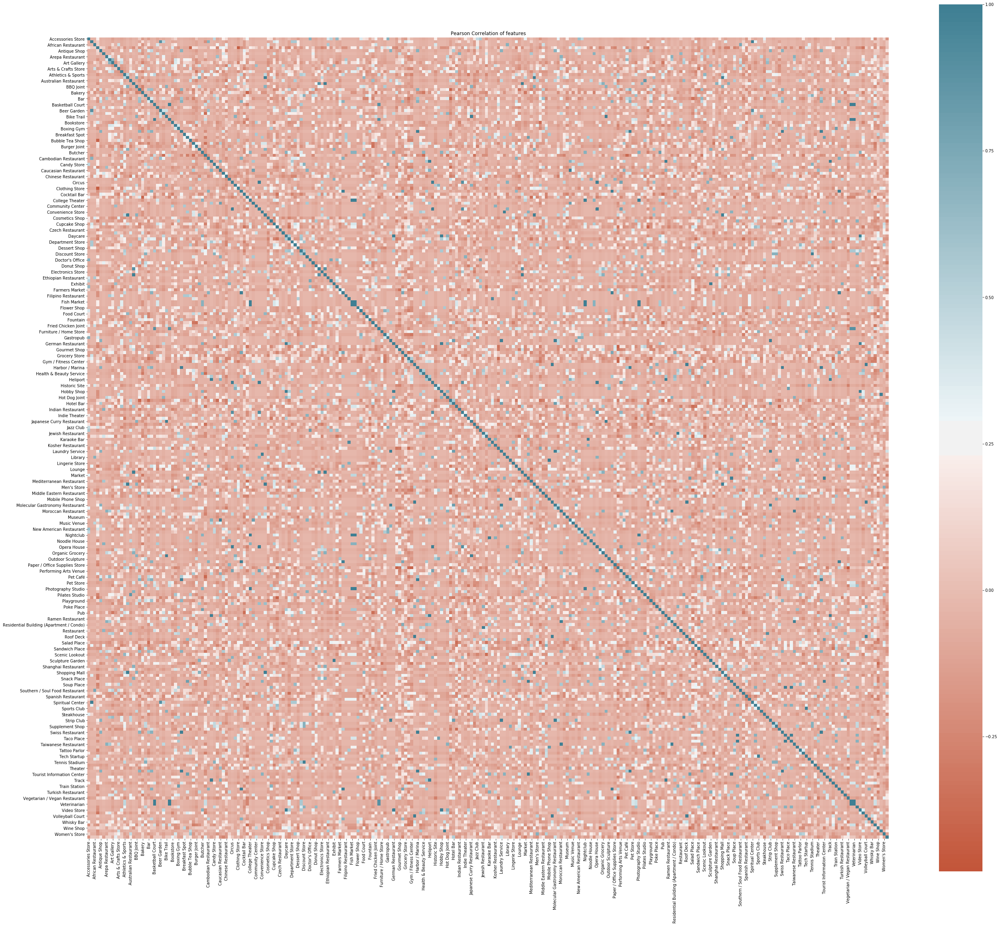

In [754]:
# f, ax = plt.subplots(figsize=(45,40))
plt.figure(figsize=(45, 40))
plt.title('Pearson Correlation of features')
heatmap_plot = sns.heatmap(mn_venues_grouped.drop('Neighborhood', 1).corr(), 
            square=True,
            cmap=sns.diverging_palette(20, 220, n=200),
            linecolor='black'
                          )

figure = heatmap_plot.get_figure()    
figure.savefig('../plots/heatmap_plot.png', dpi=600)

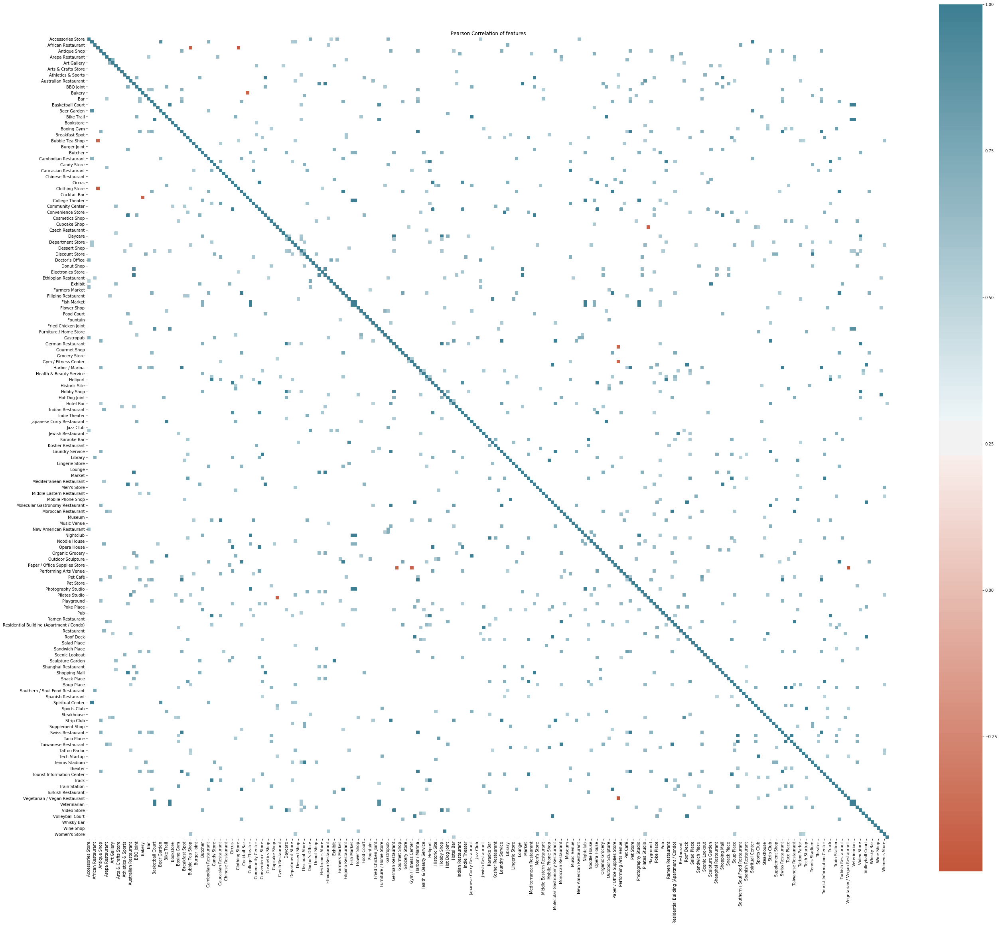

In [341]:
# f, ax = plt.subplots(figsize=(45,40))
plt.figure(figsize=(45, 40))
plt.title('Pearson Correlation of features')
corr = mn_venues_grouped.drop('Neighborhood', 1).corr()
heatmap_plot = sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            square=True,
            cmap=sns.diverging_palette(20, 220, n=200),
            linecolor='black'
                          )

figure = heatmap_plot.get_figure()    
# figure.savefig('../plots/heatmap_plot.png', dpi=600)

In [767]:
# Make an instance of the Model
# pca = PCA(n_components=20)
pca = PCA(0.99)
pca.fit(mn_venues_grouped.drop('Neighborhood', 1))
pca.n_components_
# pca.explained_variance_ratio_

38

In [783]:
data_tr = pca.transform(mn_venues_grouped.drop('Neighborhood', 1))

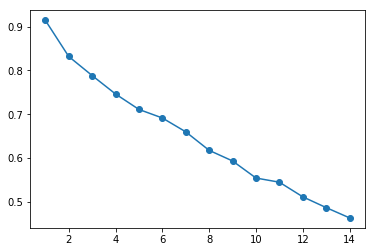

In [784]:
# A loop will be used to plot the explanatory power for up to 10 KMeans clusters
ks = range(1, 15)
inertias = []
# mn_venues_grouped_clustering = mn_venues_grouped.drop('Neighborhood', 1)
# mn_venues_grouped_clustering = mn_venues_grouped.drop('Borough', 1)


for k in ks:
    # Initialize the KMeans object using the current number of clusters (k)
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
    # Fit the scaled features to the KMeans object
    km.fit(data_tr)
    # Append the inertia for `km` to the list of inertias
    inertias.append(km.inertia_)
    
# Plot the results in a line plot
plt.plot(ks, inertias, marker='o')

There isn't a clear elbow. I choose k=5 for now. There are more sophisticated ways of picking the nuber of clusters which I will utilize later.

In [785]:
# set number of clusters
kclusters = 5

# mn_venues_grouped_clustering = mn_venues_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init='k-means++', n_init=10, random_state=0).fit(data_tr)

# check cluster labels generated for each row in the dataframe
# kmeans.labels_[0:kclusters]

Counter(kmeans.labels_)

Counter({4: 4, 2: 8, 0: 12, 3: 13, 1: 3})

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each borough.

In [787]:
df_data_tr = pd.DataFrame(data_tr) 
# df_data_tr.insert(0, 'Cluster Labels', kmeans.labels_)
df_data_tr.head()

,Cluster Labels,0,1,2,3,4,5,6,7,8,...,28,29,30,31,32,33,34,35,36,37
0,4,0.056986,-0.055260,0.089321,-0.005344,-0.012249,0.028293,0.033129,0.022583,0.073315,...,0.000451,0.007590,0.005906,0.003677,0.005238,0.005303,-0.013337,0.003727,0.006302,-0.002419
1,2,-0.043110,0.017361,0.003690,0.025295,0.069574,-0.028141,-0.043738,0.015958,0.041906,...,-0.010275,-0.019752,-0.018688,0.011258,-0.012947,-0.002781,0.019038,-0.018234,0.012076,-0.000023
2,0,0.000016,0.026683,0.005497,0.012370,0.017758,-0.040551,0.019454,0.007865,-0.028640,...,-0.023886,0.042007,0.007100,-0.000083,-0.017024,-0.001098,-0.013410,-0.005837,-0.004155,0.011188
3,3,-0.013169,0.030895,0.027880,-0.004114,-0.022624,0.000951,0.050015,0.025550,-0.014431,...,-0.013032,0.001121,-0.025325,0.001547,0.006212,-0.005718,0.016450,-0.005142,0.004407,-0.018890
4,0,0.017558,0.023990,-0.069176,-0.046908,-0.000011,0.010176,0.059020,0.013414,-0.016212,...,0.017131,0.010584,0.005553,-0.000760,-0.020628,0.000237,-0.005186,-0.015764,0.001115,0.012943


Finally, let's visualize the resulting clusters.

In [798]:
# add clustering labels
# mn_venues_sorted.drop('Cluster Labels', axis=1,inplace=True)

mn_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

mn_venues_merged = mn_venues

mn_venues_merged = pd.merge(mn_venues[['Borough','Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude']].drop_duplicates(), 
                     mn_venues_sorted,
                     left_on='Neighborhood',
                     right_on='Neighborhood',
                     how='inner')


print(mn_venues_sorted.shape)
print(mn_venues.shape)
print(mn_venues_merged.shape)
# mn_venues_merged.head() # check the last columns!
mn_venues_sorted.head()

(40, 12)
(2000, 8)
(40, 15)


,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4,Battery Park City,Park,Coffee Shop,Memorial Site,Plaza,Food Court,Shopping Mall,Wine Shop,Electronics Store,Mexican Restaurant,Garden
1,2,Carnegie Hill,Coffee Shop,Yoga Studio,Wine Shop,Spa,Bookstore,Art Museum,Gym / Fitness Center,Gym,French Restaurant,Pizza Place
2,0,Central Harlem,African Restaurant,Coffee Shop,American Restaurant,French Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant,Bar,Pizza Place,Cosmetics Shop,Chinese Restaurant
3,3,Chelsea,Ice Cream Shop,Coffee Shop,American Restaurant,Seafood Restaurant,Theater,Italian Restaurant,Cycle Studio,Scenic Lookout,Sandwich Place,Butcher
4,0,Chinatown,Ice Cream Shop,Cocktail Bar,Dumpling Restaurant,Wine Bar,Coffee Shop,Gourmet Shop,Chinese Restaurant,Sandwich Place,Seafood Restaurant,Pizza Place


In [801]:
makeClusterMap(address='Manhattan, NY' ,city_data= mn_venues_merged , city= 'pca_manhattan', zoom_level=11)

# Brooklyn Analysis

## Analyzing each neighborhood

In [487]:
br_venues_one_hot = pd.get_dummies(br_venues['Venue Category'])
print(br_venues_one_hot.shape)
br_venues_one_hot.head()

(3311, 294)


,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Video Store,Vietnamese Restaurant,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Women's Store,Yoga Studio
2162,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2163,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2164,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2165,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2166,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [488]:
# add columns to the new dataframe
br_venues_one_hot[['Neighborhood']] = br_venues[['Neighborhood']]

# move borough... columns to the beginning
new_cols_order = list(br_venues_one_hot.columns[-1:]) + list(br_venues_one_hot.columns[:-1]) 

br_venues_one_hot = br_venues_one_hot[new_cols_order]

# or
# br_venues_one_hot.insert(0, 'Borough', mn_venues['Borough'])
# br_venues_one_hot.insert(1, 'Neighborhood', mn_venues['Neighborhood'])

print(br_venues_one_hot.shape)
br_venues_one_hot.head()

(3311, 294)


,Yoga Studio,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Women's Store
2162,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2163,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2164,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2165,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2166,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category.

In [489]:
br_venues_grouped = br_venues_one_hot.groupby('Neighborhood').mean().reset_index()
print(br_venues_grouped.shape)
br_venues_grouped.head()

(70, 294)


,Neighborhood,Yoga Studio,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,...,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Women's Store
0,Bath Beach,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,...,0.00,0.0,0.02,0.02,0.0,0.0,0.00,0.00,0.0,0.0
1,Bay Ridge,0.00,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.00,...,0.02,0.0,0.00,0.00,0.0,0.0,0.02,0.00,0.0,0.0
2,Bedford Stuyvesant,0.02,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.02,...,0.00,0.0,0.02,0.00,0.0,0.0,0.00,0.06,0.0,0.0
3,Bensonhurst,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,...,0.02,0.0,0.02,0.00,0.0,0.0,0.00,0.00,0.0,0.0
4,Bergen Beach,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,...,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0


Let's print each neighborhood along with the top 5 most common venues.

In [490]:
num_top_venues = 5

for hood in br_venues_grouped['Neighborhood'][0:5]:
    print("----"+hood+"----")
    temp = br_venues_grouped[br_venues_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Bath Beach----
                  venue  freq
0           Pizza Place  0.10
1    Italian Restaurant  0.06
2                Bakery  0.06
3           Coffee Shop  0.06
4  Cantonese Restaurant  0.06


----Bay Ridge----
                 venue  freq
0                  Spa  0.10
1          Pizza Place  0.10
2   Italian Restaurant  0.06
3   Chinese Restaurant  0.04
4  American Restaurant  0.04


----Bedford Stuyvesant----
                  venue  freq
0                   Bar  0.10
1           Coffee Shop  0.10
2             Wine Shop  0.06
3  Caribbean Restaurant  0.06
4             Juice Bar  0.04


----Bensonhurst----
                venue  freq
0         Pizza Place  0.10
1              Bakery  0.08
2  Italian Restaurant  0.06
3  Chinese Restaurant  0.06
4          Bagel Shop  0.06


----Bergen Beach----
                 venue  freq
0           Donut Shop  0.17
1          Supermarket  0.08
2           Playground  0.08
3     Sushi Restaurant  0.08
4  Peruvian Restaurant  0.08




In [491]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [492]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
br_venues_sorted = pd.DataFrame(columns=columns)
br_venues_sorted['Neighborhood'] = br_venues_grouped['Neighborhood']

for ind in np.arange(br_venues_grouped.shape[0]):
    br_venues_sorted.iloc[ind, 1:] = return_most_common_venues(br_venues_grouped.iloc[ind, :], num_top_venues)

br_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bath Beach,Pizza Place,Italian Restaurant,Sushi Restaurant,Cantonese Restaurant,Bubble Tea Shop,Coffee Shop,Bakery,Supplement Shop,Chinese Restaurant,Bank
1,Bay Ridge,Pizza Place,Spa,Italian Restaurant,Hookah Bar,Bakery,Chinese Restaurant,Greek Restaurant,Bar,Grocery Store,Cosmetics Shop
2,Bedford Stuyvesant,Coffee Shop,Bar,Wine Shop,Caribbean Restaurant,Café,Juice Bar,Pizza Place,Park,Southern / Soul Food Restaurant,Seafood Restaurant
3,Bensonhurst,Pizza Place,Bakery,Italian Restaurant,Chinese Restaurant,Bagel Shop,Ice Cream Shop,Coffee Shop,Cantonese Restaurant,Bank,Japanese Restaurant
4,Bergen Beach,Donut Shop,Stables,Harbor / Marina,Peruvian Restaurant,Chinese Restaurant,Italian Restaurant,Deli / Bodega,Sushi Restaurant,Pizza Place,Playground


## Clustering Neighborhoods

Now, I'm going to run  k-means to cluster the boroughs. I use the elbow method to find the best number of clusters.

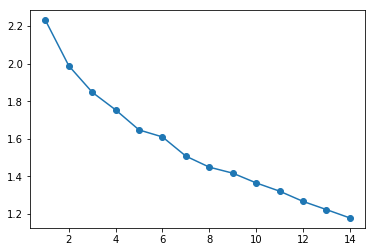

In [493]:
# A loop will be used to plot the explanatory power for up to 10 KMeans clusters
ks = range(1, 15)
inertias = []
br_venues_grouped_clustering = br_venues_grouped.drop('Neighborhood', 1)
# br_venues_grouped_clustering = br_venues_grouped.drop('Borough', 1)


for k in ks:
    # Initialize the KMeans object using the current number of clusters (k)
    km = KMeans(n_clusters=k, random_state=0)
    # Fit the scaled features to the KMeans object
    km.fit(br_venues_grouped_clustering)
    # Append the inertia for `km` to the list of inertias
    inertias.append(km.inertia_)
    
# Plot the results in a line plot
plt.plot(ks, inertias, marker='o')

There isn't a clear elbow. I choose k=5 for now. There are more sophisticated ways of picking the nuber of clusters which I will utilize later.

In [494]:
# set number of clusters
kclusters = 5

mn_venues_grouped_clustering = mn_venues_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(br_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
# kmeans.labels_[0:kclusters]

Counter(kmeans.labels_)

Counter({4: 22, 0: 30, 2: 7, 1: 10, 3: 1})

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each borough.

In [496]:
# add clustering labels
# br_venues_sorted.drop('Cluster Labels', axis=1,inplace=True)
br_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

br_venues_merged = br_venues

br_venues_merged = pd.merge(br_venues[['Borough','Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude']].drop_duplicates(), 
                     br_venues_sorted,
                     left_on='Neighborhood',
                     right_on='Neighborhood',
                     how='inner')


print(br_venues_sorted.shape)
print(br_venues.shape)
print(br_venues_merged.shape)
br_venues_merged.head() # check the last columns!

(70, 12)
(3311, 9)
(70, 15)


,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Brooklyn,Bay Ridge,40.625801,-74.030621,4,Pizza Place,Spa,Italian Restaurant,Hookah Bar,Bakery,Chinese Restaurant,Greek Restaurant,Bar,Grocery Store,Cosmetics Shop
1,Brooklyn,Bensonhurst,40.611009,-73.995180,4,Pizza Place,Bakery,Italian Restaurant,Chinese Restaurant,Bagel Shop,Ice Cream Shop,Coffee Shop,Cantonese Restaurant,Bank,Japanese Restaurant
2,Brooklyn,Sunset Park,40.645103,-74.010316,4,Bakery,Mexican Restaurant,Pizza Place,Latin American Restaurant,Bank,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant,Café,Breakfast Spot
3,Brooklyn,Greenpoint,40.730201,-73.954241,0,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Mexican Restaurant,French Restaurant,Yoga Studio,Café,Restaurant,Tea Room
4,Brooklyn,Gravesend,40.595260,-73.973471,4,Pizza Place,Bakery,Donut Shop,Lounge,Bar,Pool Hall,Bank,Bagel Shop,Supermarket,Pharmacy


Finally, let's visualize the resulting clusters.

In [991]:
makeClusterMap(address='Brooklyn, NY' ,city_data=br_venues_merged , city= 'brooklyn', zoom_level=11)

## Examining Clusters

Now, we can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, we can also assign a name to each cluster.

In [498]:
for cl in range(0,kclusters):
    br_venues_merged.loc[br_venues_merged['Cluster Labels'] == cl, br_venues_merged.columns[[1] + list(range(5, br_venues_merged.shape[1]))]].reset_index(drop=True).to_html('../tables/brooklyn_cl_{}.html'.format(cl))
    

**Cluster 0**

In [628]:
br_venues_merged.loc[br_venues_merged['Cluster Labels'] == 0, br_venues_merged.columns[[1] + list(range(5, br_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Greenpoint,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Mexican Restaurant,French Restaurant,Yoga Studio,Café,Restaurant,Tea Room
8,Flatbush,Caribbean Restaurant,Mexican Restaurant,Bar,Coffee Shop,Pizza Place,Middle Eastern Restaurant,Café,Health Food Store,Deli / Bodega,Restaurant
9,Crown Heights,Café,Pizza Place,Coffee Shop,Cocktail Bar,Caribbean Restaurant,Juice Bar,Bakery,Museum,Cajun / Creole Restaurant,Sushi Restaurant
12,Windsor Terrace,Wine Shop,Park,Bar,Café,Deli / Bodega,Playground,Diner,Italian Restaurant,Middle Eastern Restaurant,Beer Garden
13,Prospect Heights,Bar,Cocktail Bar,Pizza Place,Beer Bar,New American Restaurant,Mexican Restaurant,Thai Restaurant,Café,Southern / Soul Food Restaurant,Ice Cream Shop
15,Williamsburg,Pizza Place,Bar,Wine Bar,Coffee Shop,Mediterranean Restaurant,Cocktail Bar,Creperie,Pilates Studio,Salon / Barbershop,Burger Joint
16,Bushwick,Bar,Mexican Restaurant,Pizza Place,Coffee Shop,Café,French Restaurant,Latin American Restaurant,Deli / Bodega,Bakery,Thrift / Vintage Store
17,Bedford Stuyvesant,Coffee Shop,Bar,Wine Shop,Caribbean Restaurant,Café,Juice Bar,Pizza Place,Park,Southern / Soul Food Restaurant,Seafood Restaurant
18,Brooklyn Heights,Park,Yoga Studio,Italian Restaurant,Pet Store,Scenic Lookout,Ice Cream Shop,Coffee Shop,Gym,American Restaurant,Deli / Bodega
19,Cobble Hill,Yoga Studio,Italian Restaurant,Playground,Bar,Bakery,Bagel Shop,Cocktail Bar,Ice Cream Shop,Gourmet Shop,Seafood Restaurant


**Cluster 1**

In [626]:
br_venues_merged.loc[br_venues_merged['Cluster Labels'] == 1, br_venues_merged.columns[[1] + list(range(5, br_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,East Flatbush,Caribbean Restaurant,Discount Store,Lounge,Supermarket,Grocery Store,Chinese Restaurant,Food Truck,Liquor Store,Furniture / Home Store,Check Cashing Service
14,Brownsville,Pizza Place,Discount Store,Sandwich Place,Gas Station,Mobile Phone Shop,Fast Food Restaurant,Fried Chicken Joint,Caribbean Restaurant,Grocery Store,Restaurant
28,Canarsie,Caribbean Restaurant,Pizza Place,Bank,Pharmacy,Mexican Restaurant,Taco Place,Chinese Restaurant,Donut Shop,Lawyer,Fried Chicken Joint
29,Flatlands,Caribbean Restaurant,Discount Store,Supermarket,Mobile Phone Shop,Pharmacy,Park,Pizza Place,Donut Shop,Sandwich Place,Fried Chicken Joint
55,Wingate,Pizza Place,Caribbean Restaurant,Donut Shop,Deli / Bodega,Sandwich Place,Bagel Shop,Fried Chicken Joint,Grocery Store,Discount Store,Fast Food Restaurant
56,Rugby,Caribbean Restaurant,Pizza Place,Mobile Phone Shop,Bank,Donut Shop,Pharmacy,Sandwich Place,Fried Chicken Joint,Ice Cream Shop,Seafood Restaurant
57,Remsen Village,Caribbean Restaurant,Donut Shop,Fast Food Restaurant,Deli / Bodega,Food,Fried Chicken Joint,Supermarket,Sandwich Place,Discount Store,Supplement Shop
58,New Lots,Pizza Place,Fast Food Restaurant,Convenience Store,Caribbean Restaurant,Grocery Store,Park,Bus Stop,Salon / Barbershop,Donut Shop,Metro Station
59,Paerdegat Basin,Caribbean Restaurant,Harbor / Marina,Cosmetics Shop,Grocery Store,Chinese Restaurant,Skate Park,Bike Trail,Fried Chicken Joint,Thai Restaurant,Basketball Court
69,Erasmus,Caribbean Restaurant,Mobile Phone Shop,Discount Store,Pizza Place,Pharmacy,Donut Shop,Bank,Juice Bar,Lounge,Bar


**Cluster 2**

In [627]:
br_venues_merged.loc[br_venues_merged['Cluster Labels'] == 2, br_venues_merged.columns[[1] + list(range(5, br_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
25,Cypress Hills,Donut Shop,Latin American Restaurant,Fast Food Restaurant,Chinese Restaurant,Grocery Store,Pizza Place,Discount Store,Fried Chicken Joint,Ice Cream Shop,Shoe Store
26,East New York,Pizza Place,Sandwich Place,Chinese Restaurant,Supermarket,Yoga Studio,Fast Food Restaurant,Metro Station,Food Truck,Market,Furniture / Home Store
43,Ocean Hill,Discount Store,Fried Chicken Joint,Pizza Place,Donut Shop,Southern / Soul Food Restaurant,Café,Coffee Shop,Restaurant,Fast Food Restaurant,Ice Cream Shop
44,City Line,Pizza Place,Fast Food Restaurant,Supermarket,Donut Shop,Bank,Food Truck,Discount Store,Shoe Store,Latin American Restaurant,Grocery Store
45,Bergen Beach,Donut Shop,Stables,Harbor / Marina,Peruvian Restaurant,Chinese Restaurant,Italian Restaurant,Deli / Bodega,Sushi Restaurant,Pizza Place,Playground
64,Broadway Junction,Deli / Bodega,Donut Shop,Discount Store,Pizza Place,Diner,Latin American Restaurant,Supermarket,Bakery,Grocery Store,Sandwich Place
67,Highland Park,Pizza Place,Latin American Restaurant,Donut Shop,Ice Cream Shop,Fast Food Restaurant,Bakery,Sandwich Place,Fried Chicken Joint,Gym / Fitness Center,Discount Store


**Cluster 3**

In [624]:
br_venues_merged.loc[br_venues_merged['Cluster Labels'] == 3, br_venues_merged.columns[[1] + list(range(5, br_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
39,Sea Gate,Beach,Supermarket,Home Service,Fried Chicken Joint,Bus Stop,Bus Station,Donut Shop,Park,Pharmacy,Spa


**Cluster 4**

In [625]:
br_venues_merged.loc[br_venues_merged['Cluster Labels'] == 4, br_venues_merged.columns[[1] + list(range(5, br_venues_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bay Ridge,Pizza Place,Spa,Italian Restaurant,Hookah Bar,Bakery,Chinese Restaurant,Greek Restaurant,Bar,Grocery Store,Cosmetics Shop
1,Bensonhurst,Pizza Place,Bakery,Italian Restaurant,Chinese Restaurant,Bagel Shop,Ice Cream Shop,Coffee Shop,Cantonese Restaurant,Bank,Japanese Restaurant
2,Sunset Park,Bakery,Mexican Restaurant,Pizza Place,Latin American Restaurant,Bank,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant,Café,Breakfast Spot
4,Gravesend,Pizza Place,Bakery,Donut Shop,Lounge,Bar,Pool Hall,Bank,Bagel Shop,Supermarket,Pharmacy
5,Brighton Beach,Eastern European Restaurant,Mobile Phone Shop,Sushi Restaurant,Supermarket,Food Truck,Aquarium,Grocery Store,Restaurant,Bakery,Russian Restaurant
6,Sheepshead Bay,Italian Restaurant,Turkish Restaurant,Pizza Place,Sushi Restaurant,Sandwich Place,Grocery Store,Bagel Shop,Burger Joint,Café,Russian Restaurant
7,Manhattan Terrace,Pizza Place,Bagel Shop,Sushi Restaurant,Donut Shop,Pharmacy,Grocery Store,Ice Cream Shop,Bank,Turkish Restaurant,Mobile Phone Shop
11,Kensington,Pizza Place,Thai Restaurant,Café,Ice Cream Shop,Grocery Store,Sandwich Place,Mexican Restaurant,Bakery,Dive Bar,Flower Shop
27,Starrett City,Pizza Place,Department Store,Women's Store,Shoe Store,Pharmacy,Furniture / Home Store,Kids Store,Discount Store,Clothing Store,Mobile Phone Shop
30,Mill Island,Pizza Place,Harbor / Marina,Burger Joint,Gym,Stables,Golf Course,Shopping Mall,Seafood Restaurant,Chinese Restaurant,Park


## Evaluation & other clustering methods 

In [848]:
metrics.silhouette_score(br_venues_grouped_clustering, kmeans.labels_, metric='euclidean')

0.08921187481496572

In [931]:
for linkage in  ['ward', 'complete', 'average', 'single']:
    for n_clusters in range(2, 10):
        clustering(data=br_venues_grouped_clustering, linkage=linkage, n_clusters=n_clusters)

ward 2
Counter({0: 41, 1: 29})
0.08247310329841387
ward 3
Counter({1: 29, 2: 23, 0: 18})
0.07909576128101987
ward 4
Counter({1: 29, 2: 23, 0: 17, 3: 1})
0.08486502517810146
ward 5
Counter({0: 29, 2: 23, 1: 9, 4: 8, 3: 1})
0.09117950981775884
ward 6
Counter({2: 23, 1: 18, 5: 11, 0: 9, 4: 8, 3: 1})
0.08480611622477392
ward 7
Counter({2: 23, 0: 18, 5: 11, 4: 8, 1: 8, 6: 1, 3: 1})
0.08467686647429064
ward 8
Counter({0: 23, 5: 11, 1: 11, 4: 8, 3: 8, 2: 7, 6: 1, 7: 1})
0.08110841877671376
ward 9
Counter({5: 12, 2: 11, 1: 11, 3: 11, 4: 8, 8: 8, 0: 7, 6: 1, 7: 1})
0.08091224852937606
complete 2
Counter({0: 69, 1: 1})
0.34789040664340726
complete 3
Counter({0: 68, 2: 1, 1: 1})
0.252418357730962
complete 4
Counter({0: 63, 1: 5, 2: 1, 3: 1})
0.03004512303863835
complete 5
Counter({0: 53, 1: 10, 4: 5, 2: 1, 3: 1})
0.020854118147001124
complete 6
Counter({1: 45, 0: 10, 2: 8, 4: 5, 5: 1, 3: 1})
0.05033319423624585
complete 7
Counter({0: 45, 1: 9, 2: 8, 4: 5, 5: 1, 6: 1, 3: 1})
0.050750628182857534
c

# Manhattans's Housing Sales

## Data

Now I add the housing sale price from https://data.cityofnewyork.us/Housing-Development/NYC-Calendar-Sales-Archive-/uzf5-f8n2

In [885]:
all_files = glob.glob("../data/housing/Manhattan Housing Sales Data/*.xls")

mn_sales = pd.DataFrame()

for f in all_files:
    mn_sale = pd.read_excel(f, index_col=None,header=None, skiprows=5 )
    mn_sales = mn_sales.append(mn_sale)

columns = pd.read_excel(glob.glob("../data/housing/Manhattan Housing Sales Data/2015*.xls")[0],header=None).iloc[4].str.rstrip()
mn_sales.columns = columns

mn_sales.to_csv('../data/manhattan_sales.csv')

In [886]:
mn_sales = pd.read_csv('../data/manhattan_sales.csv')
mn_sales.drop(columns = ['Unnamed: 0'], axis=1, inplace =True)

# mn_sales['SALE DATE'] = datetime.strptime(mn_sales['SALE DATE'], '20%y-%m-%d')
mn_sales['SALE DATE'] = mn_sales['SALE DATE'].astype('datetime64[ns]')
mn_sales['year'] = pd.DatetimeIndex(mn_sales['SALE DATE']).year
mn_sales['month'] = pd.DatetimeIndex(mn_sales['SALE DATE']).month

mn_sales['NEIGHBORHOOD'] = mn_sales['NEIGHBORHOOD'].str.strip()

pd.DataFrame(mn_sales.columns, columns=['columns'])

,columns
0,BOROUGH
1,NEIGHBORHOOD
2,BUILDING CLASS CATEGORY
3,TAX CLASS AT PRESENT
4,BLOCK
5,LOT
6,EASE-MENT
7,BUILDING CLASS AT PRESENT
8,ADDRESS
9,APARTMENT NUMBER


In [887]:
mn_sales = mn_sales.iloc[:, [1,16,19,21,22]]
print(mn_sales.shape)
mn_sales.to_csv('../data/manhattan_sales_flask.csv')
mn_sales.head()

(315717, 5)


,NEIGHBORHOOD,YEAR BUILT,SALE PRICE,year,month
0,ALPHABET CITY,1900,6500000,2015,3
1,ALPHABET CITY,1900,3775000,2015,10
2,ALPHABET CITY,1899,2900000,2015,6
3,ALPHABET CITY,1955,6995000,2015,6
4,ALPHABET CITY,1899,20000000,2015,11


## Exploring The Data

In [235]:
mn_sales['SALE PRICE'].describe()

count    3.157170e+05
mean     1.877753e+06
std      2.248549e+07
min      0.000000e+00
25%      2.143900e+04
50%      4.870000e+05
75%      1.105000e+06
max      4.111112e+09
Name: SALE PRICE, dtype: float64

Wow there's a sale price of more than 4 billion dollars. Out of curiosity let's see this sale.

In [236]:
mn_sales.loc[mn_sales['SALE PRICE'].idxmax()]

BOROUGH                                                                      1
NEIGHBORHOOD                                                          KIPS BAY
BUILDING CLASS CATEGORY           08  RENTALS - ELEVATOR APARTMENTS           
TAX CLASS AT PRESENT                                                         2
BLOCK                                                                      972
LOT                                                                          1
EASE-MENT                                                                     
BUILDING CLASS AT PRESENT                                                   D7
ADDRESS                              240 1 AVENUE                             
APARTMENT NUMBER                                                              
ZIP CODE                                                                 10009
RESIDENTIAL UNITS                                                         8759
COMMERCIAL UNITS                                    

Looks like this is a giant block building.  

Let's see what are the other highest sales values.

In [254]:
mn_sales['SALE PRICE'].sort_values(ascending=False).head(10)

7063      4111111766
102732    4040527000
298260    3330132711
256775    2800000000
12079     2200000000
299802    2100000000
160883    1800000000
8348      1791829000
10813     1775000000
274579    1770000000
Name: SALE PRICE, dtype: int64

Let's get the 90% percentile value.

In [264]:
mn_sales['SALE PRICE'].quantile(0.95)

4500000.0

In [177]:
mn_sales.groupby(['year','month'])['SALE PRICE'].agg(['count','mean','median']).reset_index().head(10)

,year,month,count,mean,median
0,2003,1,1686,7.961797e+05,360000.0
1,2003,2,2181,9.227956e+05,325090.0
2,2003,3,1521,7.963793e+05,372500.0
3,2003,4,1619,7.471303e+05,390000.0
4,2003,5,1727,7.522539e+05,390390.0
5,2003,6,1926,1.063677e+06,354950.0
6,2003,7,1894,8.936801e+05,401171.0
7,2003,8,1932,1.184738e+06,388131.5
8,2003,9,2050,1.418616e+06,405500.0
9,2003,10,2039,1.319759e+06,365000.0


We can see there is a big difference between mean and median. 

Now, let's take a look at the distribution price of housing sales for each year.

I write a function to generate all the histograms I want.

In [296]:
def makeHistPlots(data, time_period, start, stop, step):
    ncols = 2
    nrows = int(np.ceil(len(time_period) / (1.0*ncols)))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(30, 20))
    
    bin_values = np.arange(start=start, stop=stop, step=step)

    counter = list(time_period)[0]
    for i in range(nrows):
        for j in range(ncols):

            ax = axes[i][j]

            # Plot when we have data
            if counter in time_period:
                ax.hist(data[data['year'] == counter]['SALE PRICE'], bins=bin_values, color='blue', alpha=0.5, label='{}'.format(counter))
                ax.set_xlabel('Price')
                ax.set_ylabel('')
#                 ax.set_ylim([0, 5])
                leg = ax.legend(loc='upper right')
                leg.draw_frame(False)

            # Remove axis when we no longer have data
            else:
                ax.set_axis_off()

            counter += 1

    plt.show()

I'm gonna look at the home values up to $4,500,000. (The 95% percentile.)

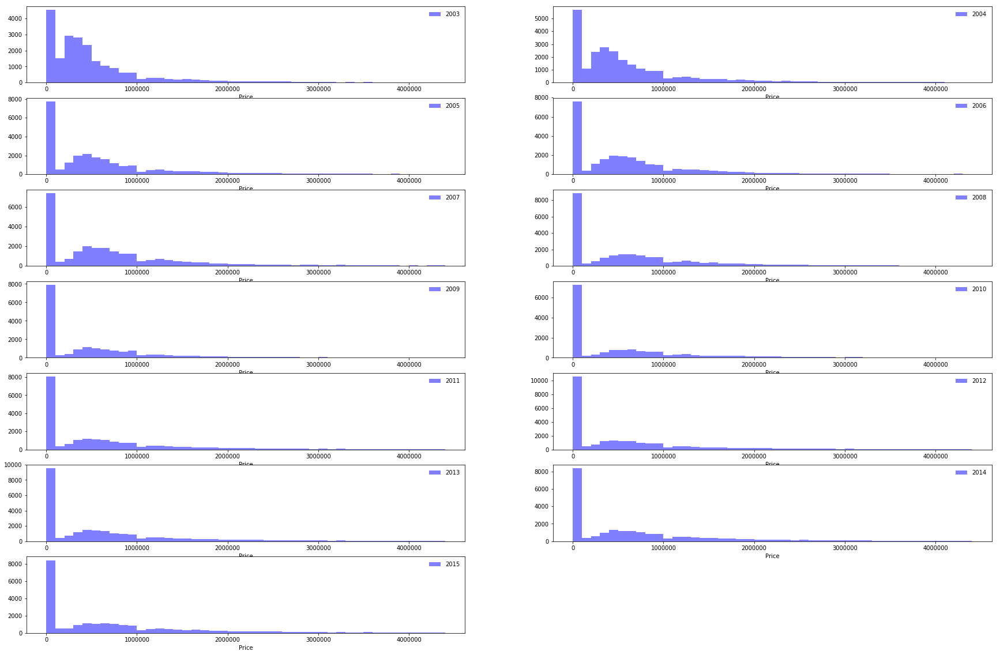

In [298]:
makeHistPlots(data=mn_sales, time_period = range(2003,2016),start=0, stop=4500000, step=100000)

There are high number of houses sold for under $100K. This is highly unusual if not impossible for manhttan. This should be one of the factors contributing to the high difference between the mean and median values.  

Let's take a closer look at the values under $100k. 

In [224]:
print('Out of total {} records with under $100K value, there are {} records where the sale price is $0.'.format(sum(mn_sales['SALE PRICE'] <= 100000) ,sum(mn_sales['SALE PRICE'] == 0)))
      

Out of total 101950 records with under $100K value, there are 63691 records where the sale price is $0.


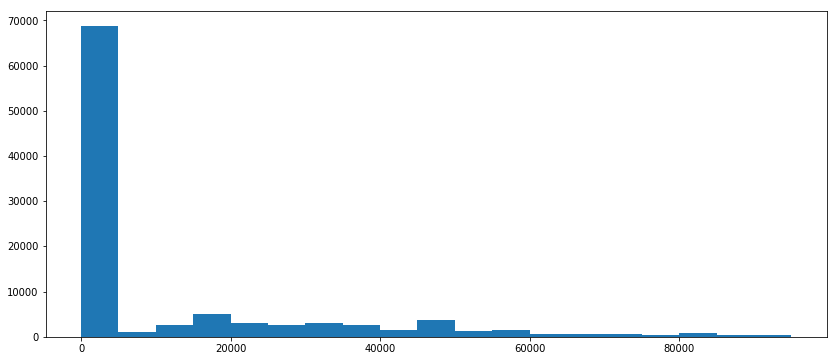

In [226]:
data = mn_sales[mn_sales['SALE PRICE'] <= 100000]

bin_values = np.arange(start=0, stop=100000, step=5000)
data['SALE PRICE'].hist(bins=bin_values, figsize=[14,6], grid=False)

So we can see there are numerous records with values under $10k.  

I'm going to remove all the records with values under $100k and get the basic statistics and plot the histograms again.

In [407]:
data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data['SALE PRICE'].describe()

count    2.139560e+05
mean     2.765035e+06
std      2.726950e+07
min      1.000000e+05
25%      4.750000e+05
50%      8.000000e+05
75%      1.620000e+06
max      4.111112e+09
Name: SALE PRICE, dtype: float64

In [406]:
print('The 95% percentile is ', data['SALE PRICE'].quantile(0.95))

The 95% percentile is  6184722.75


I'm gonna look at the home values up to $6,200,000. (The 95% percentile.)

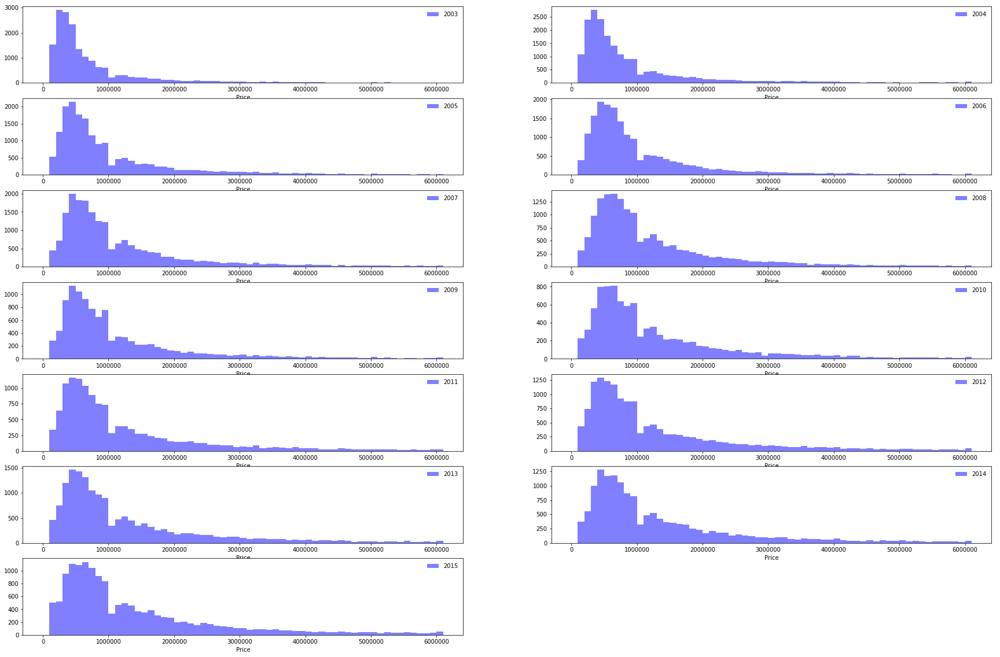

In [408]:
data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
      
makeHistPlots(data=data, time_period = range(2003,2016),start=0, stop=6200000, step=100000)

There is a sharp drop in homes with 1 to 1.1 million dollars. One resaon could be that the seller would rather list their home under 1 million dollars so they sell it easier rather that, for ex, 1.05  million dollars.  

Let's see change of monthly median sale price over time.

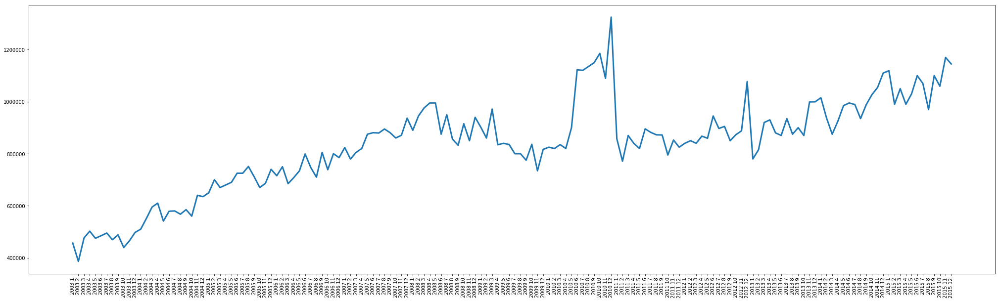

In [762]:
plt.figure(figsize=(35,10))

data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data = data.groupby(['year','month']).median().reset_index()

x = data['year'].map(str) + ' ' + data['month'].map(str)
y = data['SALE PRICE']

plt.xticks(rotation=90)
# plt.fill_between(x, y, color='#539ecd')
plt.plot(x,y,linewidth=3)
# sns.lineplot(x,y)

## Neighborhoods

Let's get the median price of homes in each neighborhoods for the whole period and plot them on a bar plot.

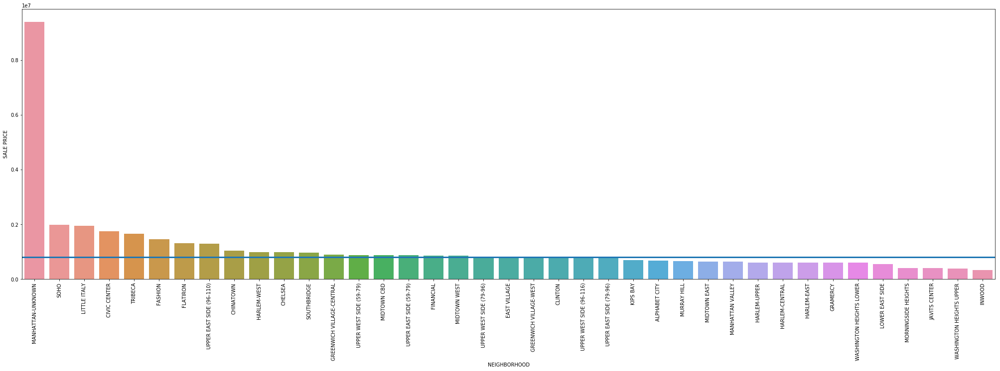

In [888]:
plt.figure(figsize=(35,10))

data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
mn_median = data['SALE PRICE'].median()
data = data.groupby(['NEIGHBORHOOD']).median().reset_index().sort_values(by=['SALE PRICE'],ascending=False)
x = data['NEIGHBORHOOD']
y = data['SALE PRICE']
plt.xticks(rotation=90)
sns.barplot(x,y)
# plt.bar(x,y)
plt.axhline(y=mn_median,linewidth=3)


The'MANHATTAN-UNKNOWN' neighborhood has a very high median. Let's examin that closer. 

In [892]:
data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data[data['NEIGHBORHOOD']== 'MANHATTAN-UNKNOWN'].loc[:,'SALE PRICE']

8155      12000000
54949     26893000
103859     1989660
103860    10600000
103861     6500000
129705     3000000
157472    13300000
157474     9400000
184036      750000
299491     5000000
299492    10000000
Name: SALE PRICE, dtype: int64

There are only 11 sales in this category. I'm going to remove it from my visualization.  

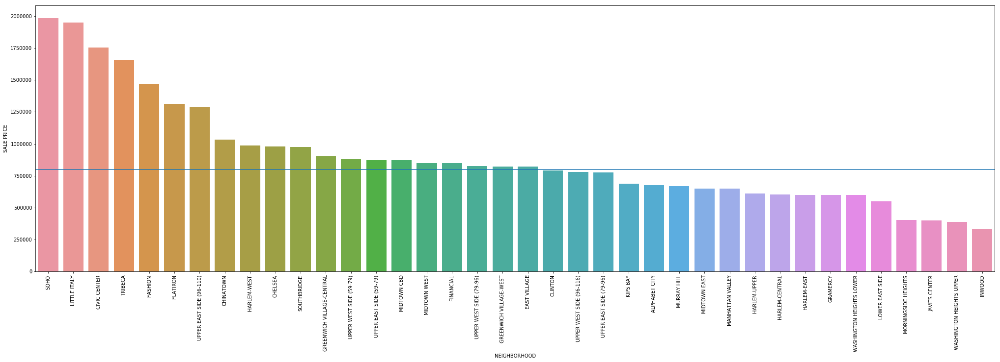

In [765]:
plt.figure(figsize=(35,10))

data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data = data[data['NEIGHBORHOOD'] != 'MANHATTAN-UNKNOWN']
mn_median = data['SALE PRICE'].median()
data = data.groupby(['NEIGHBORHOOD']).median().reset_index().sort_values(by=['SALE PRICE'],ascending=False)
x = data['NEIGHBORHOOD']
y = data['SALE PRICE']
plt.xticks(rotation=90)
sns.barplot(x,y,linewidth=3)
# plt.bar(x,y)
plt.axhline(y=mn_median)

Let's also take a look at the same graph for the last year of data.

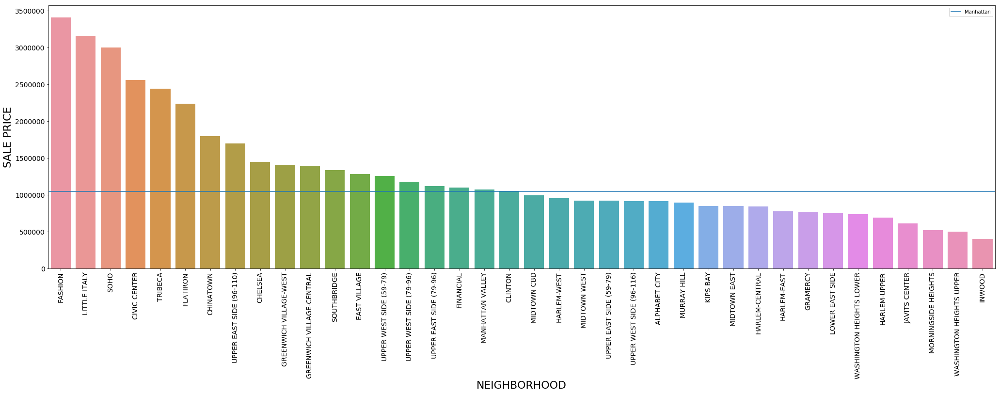

In [1035]:
plt.figure(figsize=(35,10))

data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data = data[data['year'] == 2015]
data = data[data['NEIGHBORHOOD'] != 'MANHATTAN-UNKNOWN']
mn_median = data['SALE PRICE'].median()
data = data.groupby(['NEIGHBORHOOD']).median().reset_index().sort_values(by=['SALE PRICE'],ascending=False)
x = data['NEIGHBORHOOD']
y = data['SALE PRICE']
# plt.xticks(rotation=90)

plt.xticks(rotation=90, fontsize=14)
plt.yticks(fontsize=14)

sns.barplot(x,y)
# plt.bar(x,y)
plt.axhline(y=mn_median, label="Manhattan")
plt.legend()

ax.set(xlabel='Neighborhood', ylabel='Median Sales Price')
plt.rcParams["axes.labelsize"] = 22
    
plt.savefig('../plots/2015_median.png')

Let's take a quicker look at "FASHION" neighborhood. There isn't actually a neighborhood with this exact name in manhattan.

In [443]:
data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data[data['NEIGHBORHOOD'] == "FASHION"].count()

BOROUGH                           1729
NEIGHBORHOOD                      1729
BUILDING CLASS CATEGORY           1729
TAX CLASS AT PRESENT              1729
BLOCK                             1729
LOT                               1729
EASE-MENT                         1729
BUILDING CLASS AT PRESENT         1729
ADDRESS                           1729
APARTMENT NUMBER                  1729
ZIP CODE                          1729
RESIDENTIAL UNITS                 1729
COMMERCIAL UNITS                  1729
TOTAL UNITS                       1729
LAND SQUARE FEET                  1729
GROSS SQUARE FEET                 1729
YEAR BUILT                        1729
TAX CLASS AT TIME OF SALE         1729
BUILDING CLASS AT TIME OF SALE    1729
SALE PRICE                        1729
SALE DATE                         1729
year                              1729
month                             1729
dtype: int64

The addresses belong to midtown west are of manhattan. Let's see how many sales for each month there are.

In [893]:
def neighborhoodVsWholeGraph(data,neighborhood):
    
    data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
    data = data[data['NEIGHBORHOOD'] == neighborhood].groupby(['year','month']).median().reset_index()

    x = data['year'].map(str) + '_' + data['month'].map(str)
    y = data['SALE PRICE']
    
    data_whole = mn_sales[mn_sales['SALE PRICE'] >= 100000]
    data_whole = data_whole.groupby(['year','month']).median().reset_index()

    x2 = data_whole['year'].map(str) + '_' + data_whole['month'].map(str)
    y2 = data_whole['SALE PRICE']

    fig, ax = plt.subplots(1,1,figsize=(35,10))
    
    ax.plot(x,y, linewidth=3, label= neighborhood)
    
    ax.set_xticks(x[::3])
    ax.set_xticklabels(x[::3], rotation=70, fontsize=14)
    ax.set_yticklabels(ax.get_yticks(), fontsize=16)
    
    ax.plot(x2,y2, linewidth=3, label= 'Manhattan')
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    
    ax.set_ylabel('Price', fontsize=30)
    ax.set_xlabel('Time', fontsize=30)
    
    ax.xaxis.get_label().set_style('italic')
    ax.yaxis.get_label().set_style('italic')
    
    ax.legend(loc='upper left', prop={'size': 20}, frameon=False)
#     plt.show()
    plt.savefig('../plots/neighborhoodVsWholeGraph/{}VsWholeGraph.png'.format(neighborhood))
    
#     plt.figure(figsize=(35,10))
#     plt.title('Median Monthly Housing Sale Price',fontsize=24)
#     plt.ylabel('Price', fontsize=20)
#     plt.xlabel('Time', fontsize=20)
#     plt.xticks(rotation=90)
#     plt.plot(x,y,linewidth=3, label= neighborhood)
#     plt.plot(x2,y2,linewidth=3, label= 'Manhattan')
#     plt.legend(loc='upper left', prop={'size': 20})

/usr/local/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


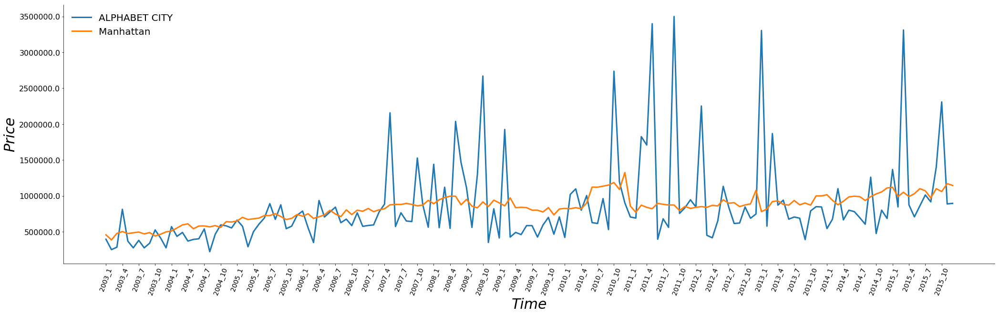

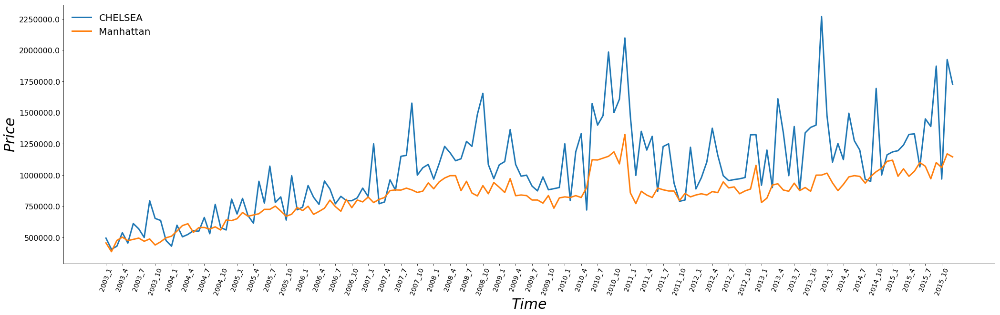

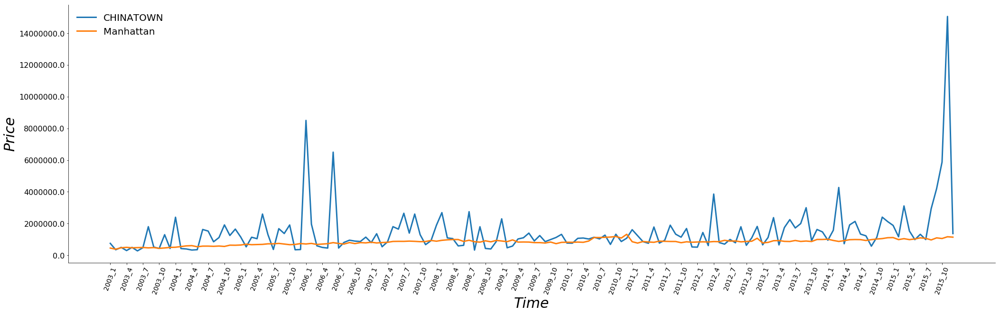

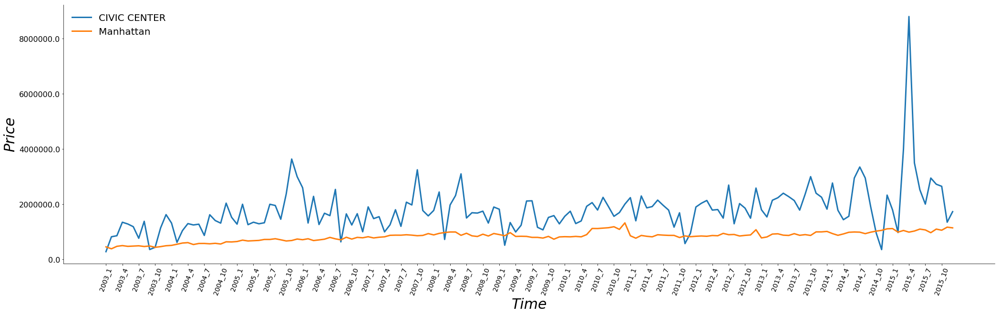

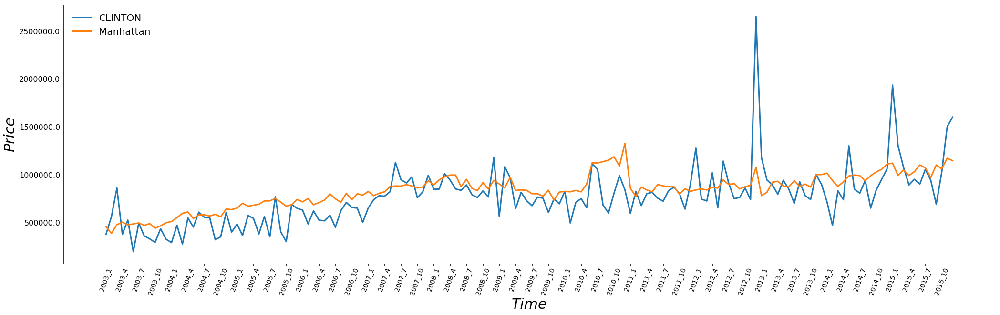

...

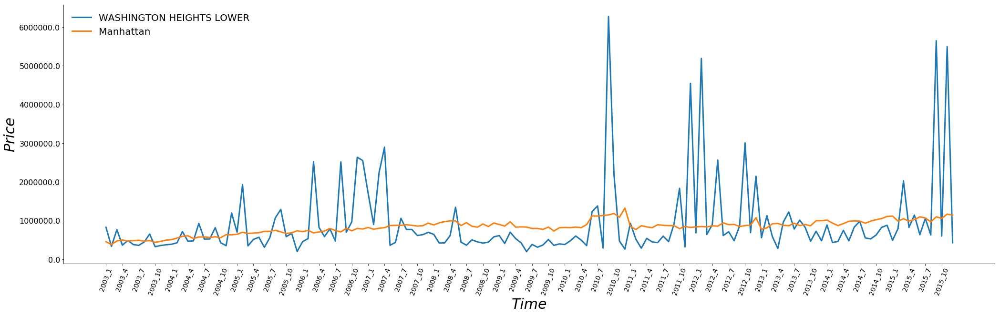

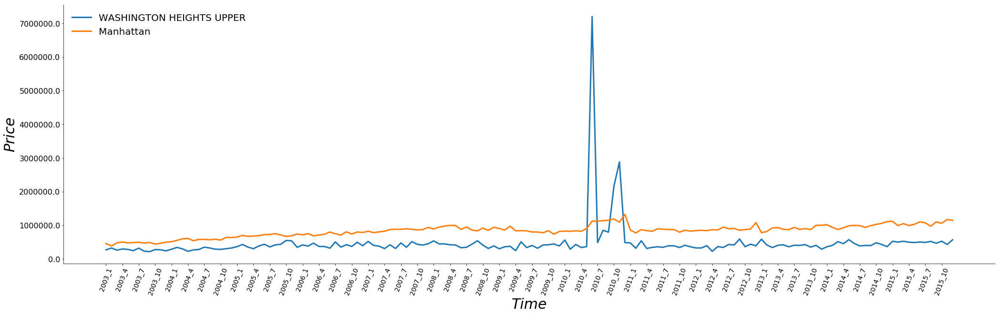

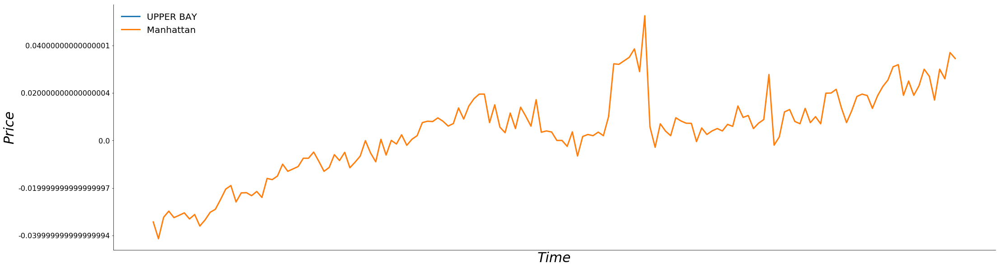

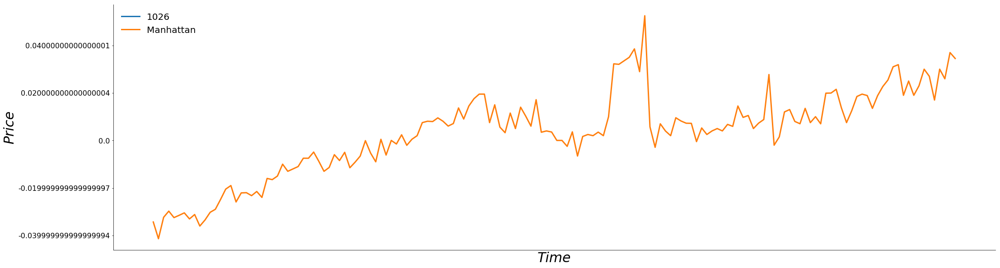

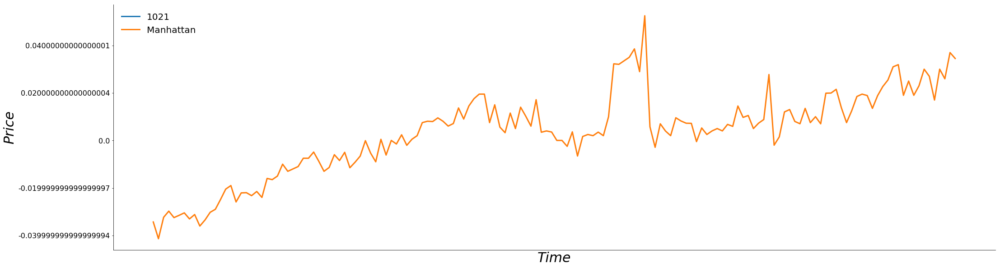

In [899]:
listN = mn_sales['NEIGHBORHOOD'].unique()
for neighborhood in listN:
    neighborhoodVsWholeGraph(mn_sales,neighborhood)

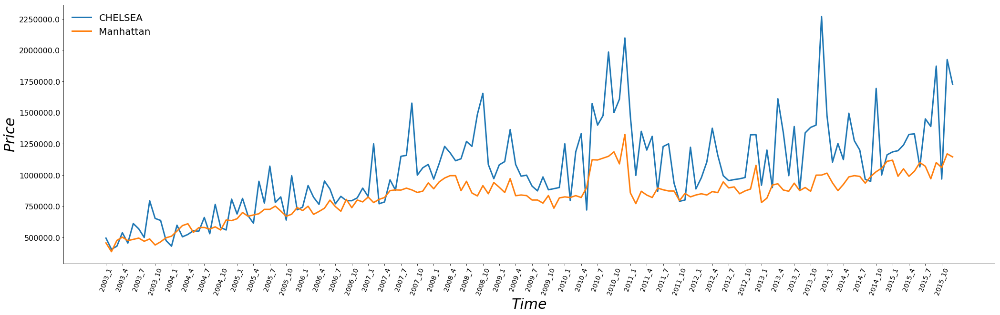

In [993]:
neighborhoodVsWholeGraph(mn_sales,'CHELSEA')

Let's see the average growth of median monthly housing for each neighborhood and see which ones have the highest value.

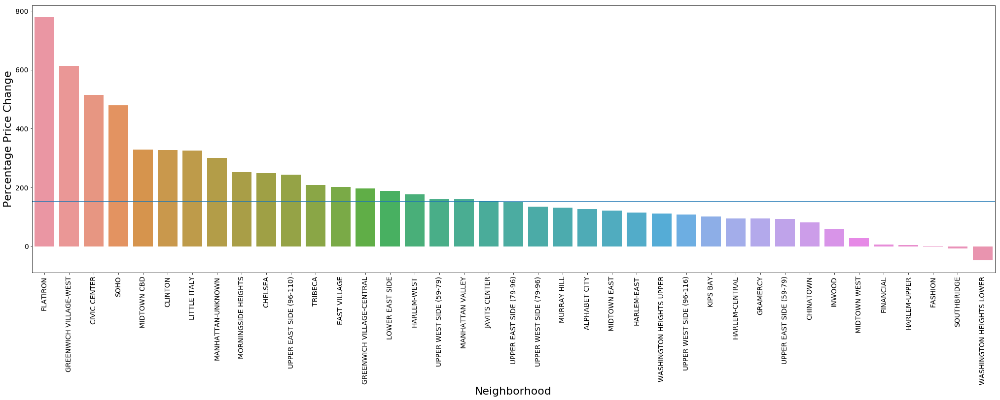

In [1033]:
data = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data = data.groupby(['NEIGHBORHOOD','year','month']).median().reset_index()
data = data.groupby('NEIGHBORHOOD')['SALE PRICE'].apply(lambda x: 100*(x.iloc[-1] - x.iloc[0])/x.iloc[0]).reset_index()
data.sort_values(by='SALE PRICE', inplace=True, ascending=False)

plt.figure(figsize=(35,10))

x = data['NEIGHBORHOOD']
y = data['SALE PRICE']

plt.xticks(rotation=90, fontsize=14)
plt.yticks(fontsize=14)

# plt.xlabel('Average Price Percentage Change', fontsize=16)

ax = sns.barplot(x,y,linewidth=3)
ax.set(xlabel='Neighborhood', ylabel='Percentage Price Change')
plt.rcParams["axes.labelsize"] = 22

data1 = mn_sales[mn_sales['SALE PRICE'] >= 100000]
data1 = data1.groupby(['year','month']).median().reset_index()
mn_change = 100*(data1['SALE PRICE'].iloc[-1] - data1['SALE PRICE'].iloc[0] )/ (data1['SALE PRICE'].iloc[0])
plt.axhline(y=mn_change, label="Manhattan")


# plt.bar(x,y)
plt.savefig('../plots/perChange.png')

I'm going to check the neighborhoods' names from the clustering section to the nrighborhoods from the housing sales data.

In [311]:
mn_data['Neighborhood'].str.lower().sort_values()

127      battery park city
247          carnegie hill
105         central harlem
116                chelsea
100              chinatown
249           civic center
113                clinton
106            east harlem
118           east village
128     financial district
276               flatiron
126               gramercy
117      greenwich village
103       hamilton heights
301           hudson yards
102                 inwood
109             lenox hill
112         lincoln square
121           little italy
119        lower east side
124       manhattan valley
104         manhattanville
6              marble hill
114                midtown
250          midtown south
125    morningside heights
115            murray hill
248                   noho
110       roosevelt island
122                   soho
275        stuyvesant town
271           sutton place
120                tribeca
274             tudor city
273             turtle bay
107        upper east side
111        upper west side
1

In [366]:
pd.Series(mn_sales['NEIGHBORHOOD'].unique())


0                 ALPHABET CITY
1                       CHELSEA
2                     CHINATOWN
3                  CIVIC CENTER
4                       CLINTON
5                  EAST VILLAGE
6                       FASHION
7                     FINANCIAL
8                      FLATIRON
9                      GRAMERCY
10    GREENWICH VILLAGE-CENTRAL
11       GREENWICH VILLAGE-WEST
12               HARLEM-CENTRAL
13                  HARLEM-EAST
14                 HARLEM-UPPER
15                  HARLEM-WEST
16                       INWOOD
17                JAVITS CENTER
18                     KIPS BAY
19                 LITTLE ITALY
20              LOWER EAST SIDE
21             MANHATTAN VALLEY
22            MANHATTAN-UNKNOWN
23                  MIDTOWN CBD
24                 MIDTOWN EAST
25                 MIDTOWN WEST
26          MORNINGSIDE HEIGHTS
27                  MURRAY HILL
28                         SOHO
29                  SOUTHBRIDGE
30                      TRIBECA
31      

So the namings are pretty different.